# Remote Work in Data Science (PACE Framework)

## Plan
The purpose of this analysis is to explore how remote work has shaped opportunities and salaries in the Data Science field.  
We will use the Data Science Salaries dataset from Kaggle, which provides information on job titles, salaries, company size, locations, and remote ratios.  

**Key Questions**:  
- Is there any difference between national remote workers and remote foreign workers?
- How do salaries differ across remote, hybrid, and onsite roles?
- Which jobs are more likely to be remote?
- Which countries and company sizes provide the most remote opportunities?
- Are remote roles associated with higher experience levels or certain types of employments?


# Importing Packages

In [1]:
!pip install pycountry

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/6.3 MB ? eta -:--:--

   ━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.2/6.3 MB 6.5 MB/s eta 0:00:01

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━ 6.0/6.3 MB 58.3 MB/s eta 0:00:01

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 39.8 MB/s eta 0:00:00


In [2]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
import pycountry
import plotly.express as px
import plotly.io as pio

from sklearn.utils import resample
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import make_scorer, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.metrics import classification_report
from sklearn.metrics import precision_recall_fscore_support



import shap
from lime import lime_tabular

In [3]:
pio.renderers.default = "iframe_connected"


# Manipulating the Dataset

In [4]:
df = pd.read_csv('/kaggle/input/data-science-salary-landscape/salaries.csv')
print(df.columns)

Index(['work_year', 'experience_level', 'employment_type', 'job_title',
       'salary', 'salary_currency', 'salary_in_usd', 'employee_residence',
       'remote_ratio', 'company_location', 'company_size'],
      dtype='object')


In [5]:
df.head(5)

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2020,EN,FT,Azure Data Engineer,100000,USD,100000,MU,0,MU,S
1,2020,EN,CT,Staff Data Analyst,60000,CAD,44753,CA,50,CA,L
2,2020,SE,FT,Staff Data Scientist,164000,USD,164000,US,50,US,M
3,2020,EN,FT,Data Analyst,42000,EUR,47899,DE,0,DE,L
4,2020,EX,FT,Data Scientist,300000,USD,300000,US,100,US,L


## Renaming values

Some of the current values are abreviated, for better readibily and because we can not see any further use for some of the current abbreviations we will proceed to rename them with full names.


In [6]:
df['company_size'].unique()

array(['S', 'L', 'M'], dtype=object)

In [7]:
df['experience_level'].unique()

array(['EN', 'SE', 'EX', 'MI'], dtype=object)

In [8]:
df['employment_type'].unique()

array(['FT', 'CT', 'PT', 'FL'], dtype=object)

In [9]:
df['company_size'] = df['company_size'].replace({
    'S': 'Small',
    'M': 'Medium',
    'L': 'Large',
})

In [10]:
df['experience_level'] = df['experience_level'].replace({
    'EN' : 'Entry-level',
    'MI' : 'Junior Mid-level',
    'SE' : 'Intermediate Senior-level',
    'EX' : 'Expert Executive-level / Director',

})

In [11]:
df['employment_type'] = df['employment_type'].replace({
    'PT' : 'Part-time',
    'FT' : 'Full-time',
    'CT' : 'Contract',
    'FL' : 'Freelance',

})

In [12]:
df['remote_ratio'] = df['remote_ratio'].replace({
    0 : 'On-site',
    50 : 'Hybrid',
    100 : 'Full Remote',

    })

## Analyzing & Reorganizing Data


### Analyzing "job_titles"

In [13]:
total_unique_jobs = df['job_title'].unique()
total_unique_jobs_count = len(total_unique_jobs)
print("Number of unique job titles in the dataset:",total_unique_jobs_count)

Number of unique job titles in the dataset: 215


In [14]:
total_jobs = len(df['job_title'])
print("Number of total jobs / employees in the dataset:",total_jobs)

Number of total jobs / employees in the dataset: 37234


In [15]:
top_10_common_jobs_count = df['job_title'].value_counts().head(10)
print("Top 10 most usual data science jobs':")
print(top_10_common_jobs_count)

Top 10 most usual data science jobs':
job_title
Data Scientist               7448
Data Engineer                6103
Data Analyst                 4351
Machine Learning Engineer    3990
Software Engineer            2935
Research Scientist           1569
Applied Scientist             881
Data Architect                807
Analytics Engineer            758
Research Engineer             708
Name: count, dtype: int64


There are **215 different job titles, that's a completly unmanageble size to make any further analysis**. Many of those different job titles are pretty much the same role in different words. The goal would be reorganizing the data into 5-10 different categories that repressent the field of Data Science in a meaningful way.

In [16]:
job_counts = df['job_title'].value_counts().reset_index()

In [17]:
job_counts['% of Total'] = job_counts['count'] / total_unique_jobs_count
job_counts.head(20)

,job_title,count,% of Total
0,Data Scientist,7448,34.641860
1,Data Engineer,6103,28.386047
2,Data Analyst,4351,20.237209
3,Machine Learning Engineer,3990,18.558140
4,Software Engineer,2935,13.651163
5,Research Scientist,1569,7.297674
6,Applied Scientist,881,4.097674
7,Data Architect,807,3.753488
8,Analytics Engineer,758,3.525581
9,Research Engineer,708,3.293023


First 5 top job titles have >75% of the total job_title distribution. So these jobs_titles should inspire the naming of these next job categories.

## Creating New Variables

### Job Categories

Creating a dictionary with keywords so it could be used to asociate job titles with the most likely fitting job category.

In [18]:
job_keywords = {
    "Data Engineer": ["Data Engineer", "architect", "etl", "pipeline",],
    "Data Analyst / BI": ["analyst", "bi", "reporting", "visualization", "insight", "analytics"],
    "Data Scientist / ML": ["scientist", "machine learning", "ml", "deep learning", "ai", "nlp", "research"],
    "Data Management / Governance": ["management", "governance", "quality", "integrity", "master data"],
    "Manager / Lead / Director": ["lead", "manager", "head", "director", "principal", "staff"],
    "Software / DevOps": ["software", "developer", "devops", "sre", "platform", "security", "fullstack", "backend", "frontend"],
    "Product / Business / Consultant": ["product", "business", "consultant", "strategy"],
    "Other Data Jobs": []  
}


In [19]:
def categorize_job(title, keyword_dict):
    title_lower = title.lower()
    for category, keywords in keyword_dict.items():
        if any(kw in title_lower for kw in keywords):
            return category
    return "Other Data Jobs"


In [20]:
job_categories_dict = {job: categorize_job(job, job_keywords) for job in total_unique_jobs}

In [21]:
df['job_category'] = df['job_title'].map(job_categories_dict)
df['job_category'].value_counts().reset_index()

,job_category,count
0,Data Scientist / ML,15845
1,Other Data Jobs,7724
2,Data Analyst / BI,6713
3,Software / DevOps,3550
4,Manager / Lead / Director,1443
5,Data Engineer,1026
6,Product / Business / Consultant,766
7,Data Management / Governance,167


In [22]:
df.head(10)

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,job_category
0,2020,Entry-level,Full-time,Azure Data Engineer,100000,USD,100000,MU,On-site,MU,Small,Other Data Jobs
1,2020,Entry-level,Contract,Staff Data Analyst,60000,CAD,44753,CA,Hybrid,CA,Large,Data Analyst / BI
2,2020,Intermediate Senior-level,Full-time,Staff Data Scientist,164000,USD,164000,US,Hybrid,US,Medium,Data Scientist / ML
3,2020,Entry-level,Full-time,Data Analyst,42000,EUR,47899,DE,On-site,DE,Large,Data Analyst / BI
4,2020,Expert Executive-level / Director,Full-time,Data Scientist,300000,USD,300000,US,Full Remote,US,Large,Data Scientist / ML
5,2020,Junior Mid-level,Contract,Sales Data Analyst,60000,USD,60000,NG,On-site,NG,Medium,Data Analyst / BI
6,2020,Expert Executive-level / Director,Full-time,Staff Data Analyst,15000,USD,15000,NG,On-site,CA,Medium,Data Analyst / BI
7,2020,Junior Mid-level,Full-time,Business Data Analyst,95000,USD,95000,US,On-site,US,Medium,Data Analyst / BI
8,2020,Entry-level,Full-time,Data Analyst,20000,EUR,22809,PT,Full Remote,PT,Medium,Data Analyst / BI
9,2020,Entry-level,Full-time,Data Scientist,43200,EUR,49268,DE,On-site,DE,Small,Data Scientist / ML


Now, we have a funtioning variable "job_category" from which we will be able to extract valuable information and insights.

### Worker Type

First, we will investigate the amount of employees whose residence do not match their companys location.

In [23]:
foreign_workers = df[df['employee_residence'] != df['company_location']]

In [24]:
print("There are", len(foreign_workers), "employees whose residence do not match their company's location")

There are 135 employees whose residence do not match their company's location


In [25]:
foreign_workers['remote_ratio'].value_counts()

remote_ratio
Full Remote    105
Hybrid          22
On-site          8
Name: count, dtype: int64

It has been noticed, checking the dataset that there are **105 employees who are in a Full-Remote remote ratio** whose residence do not match their company location. For a more easily traceability we will create a new column "Worker Type" to clasify Foreign Employees from National Employees.

However, there seems to be an anomaly, **30 foreign workers have remote_ratio's different from Full-Remote, which seems to be an imposibility**. Been such a tiny amount of data and with a high chance of be faulty in some regard, we decided to clean it from the dataset.

In [26]:
df['worker_type'] = np.where(df['employee_residence'] != df['company_location'],
                             'Foreign Employee', 'National Employee')

In [27]:
df['worker_type'].value_counts()

worker_type
National Employee    37099
Foreign Employee       135
Name: count, dtype: int64

### Cleaning faulty data

After having noticed this inconsistency among "foreign employees" we proceed to create a mask in order to clean up the dataset.

In [28]:
mask = (df['remote_ratio'] != 'Full Remote') & (df['worker_type'] == 'Foreign Employee')

In [29]:
df = df[~mask]

In [30]:
df['worker_type'].value_counts()

worker_type
National Employee    37099
Foreign Employee       105
Name: count, dtype: int64

# Analyzing Metadata

Beforing doing any further exploratory analysis, we will get a brief view of the main features, stats and metrics of this dataset.

In [31]:
df.head(10)

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,job_category,worker_type
0,2020,Entry-level,Full-time,Azure Data Engineer,100000,USD,100000,MU,On-site,MU,Small,Other Data Jobs,National Employee
1,2020,Entry-level,Contract,Staff Data Analyst,60000,CAD,44753,CA,Hybrid,CA,Large,Data Analyst / BI,National Employee
2,2020,Intermediate Senior-level,Full-time,Staff Data Scientist,164000,USD,164000,US,Hybrid,US,Medium,Data Scientist / ML,National Employee
3,2020,Entry-level,Full-time,Data Analyst,42000,EUR,47899,DE,On-site,DE,Large,Data Analyst / BI,National Employee
4,2020,Expert Executive-level / Director,Full-time,Data Scientist,300000,USD,300000,US,Full Remote,US,Large,Data Scientist / ML,National Employee
5,2020,Junior Mid-level,Contract,Sales Data Analyst,60000,USD,60000,NG,On-site,NG,Medium,Data Analyst / BI,National Employee
7,2020,Junior Mid-level,Full-time,Business Data Analyst,95000,USD,95000,US,On-site,US,Medium,Data Analyst / BI,National Employee
8,2020,Entry-level,Full-time,Data Analyst,20000,EUR,22809,PT,Full Remote,PT,Medium,Data Analyst / BI,National Employee
9,2020,Entry-level,Full-time,Data Scientist,43200,EUR,49268,DE,On-site,DE,Small,Data Scientist / ML,National Employee
10,2020,Intermediate Senior-level,Full-time,Machine Learning Manager,157000,CAD,117104,CA,Hybrid,CA,Large,Data Scientist / ML,National Employee


In [32]:
df.shape

(37204, 13)

In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 37204 entries, 0 to 37233
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   work_year           37204 non-null  int64 
 1   experience_level    37204 non-null  object
 2   employment_type     37204 non-null  object
 3   job_title           37204 non-null  object
 4   salary              37204 non-null  int64 
 5   salary_currency     37204 non-null  object
 6   salary_in_usd       37204 non-null  int64 
 7   employee_residence  37204 non-null  object
 8   remote_ratio        37204 non-null  object
 9   company_location    37204 non-null  object
 10  company_size        37204 non-null  object
 11  job_category        37204 non-null  object
 12  worker_type         37204 non-null  object
dtypes: int64(3), object(10)
memory usage: 4.0+ MB


In [34]:
df.dtypes

work_year              int64
experience_level      object
employment_type       object
job_title             object
salary                 int64
salary_currency       object
salary_in_usd          int64
employee_residence    object
remote_ratio          object
company_location      object
company_size          object
job_category          object
worker_type           object
dtype: object

In [35]:
metadata = df.describe()
print(metadata)

          work_year        salary  salary_in_usd
count  37204.000000  3.720400e+04   37204.000000
mean    2023.657859  1.663775e+05  160617.096092
std        0.608868  2.260749e+05   72652.877493
min     2020.000000  1.400000e+04   15000.000000
25%     2023.000000  1.100000e+05  110000.000000
50%     2024.000000  1.500000e+05  150000.000000
75%     2024.000000  2.000000e+05  200000.000000
max     2024.000000  3.040000e+07  800000.000000


**Brief Report:**

- Not a single null-value has been detected.
- 37204 entries and 13 different values.
- 3 numerical (integers) and 10 categorical variables.
- The average salary in USD is 160,617.096092

# Exploring and Analizing Data

## Workforce Composition

### % Worforce by Remote ratio

In this section, we will explore the composition of the workforce by remote_ratio.

In [36]:
df_remoters_counts = df['remote_ratio'].value_counts().reset_index()
df_remoters_counts

,remote_ratio,count
0,On-site,28460
1,Full Remote,8509
2,Hybrid,235


In [37]:
df_remoters_counts.head(5)

,remote_ratio,count
0,On-site,28460
1,Full Remote,8509
2,Hybrid,235


In [38]:
labels = df_remoters_counts['remote_ratio']
counts = df_remoters_counts['count']

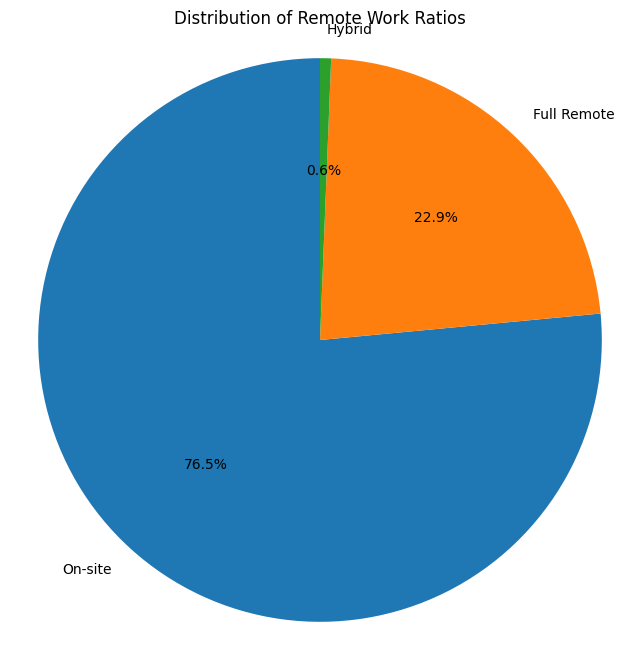

In [39]:
# Create the pie chart
plt.figure(figsize=(8, 8))
plt.pie(counts, labels=labels, autopct='%1.1f%%', startangle=90)

# Add a title
plt.title('Distribution of Remote Work Ratios')

# Ensure the chart is a circle
plt.axis('equal')

# Show the plot
plt.show()

As we can see, the vast mayority of the dataset is comprissed of:
- On-site employees are the vast mayority 76.7%.
- Full remoter employees are 22.7%.
- Hybrid employees are the vast minority with only 0.6%.

### % Full Remote Workforce that are also Foreign Workers.

In this section we will explore what's the percentage of the full remote worforce that are foreign employees.

In [40]:
df['worker_type'].value_counts()

worker_type
National Employee    37099
Foreign Employee       105
Name: count, dtype: int64

In [41]:
remoters_count = df[df['remote_ratio'] == 'Full Remote'].reset_index()
foreign_remoters_count = remoters_count['worker_type'].value_counts().reset_index()
foreign_remoters_count

,worker_type,count
0,National Employee,8404
1,Foreign Employee,105


In [42]:
foreign_employees_count = len(df[df['worker_type'] == 'Foreign Employee'])
print("The number of foreign employees is:", foreign_employees_count)

The number of foreign employees is: 105


In [43]:
labels = foreign_remoters_count['worker_type']
counts = foreign_remoters_count['count']

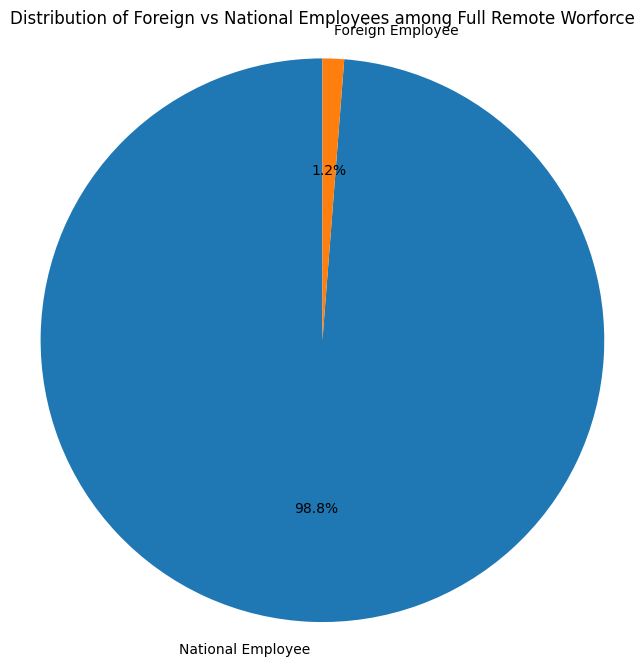

In [44]:
# Create the pie chart
plt.figure(figsize=(8, 8))
plt.pie(counts, labels=labels, autopct='%1.1f%%', startangle=90)

# Add a title
plt.title('Distribution of Foreign vs National Employees among Full Remote Worforce')

# Ensure the chart is a circle
plt.axis('equal')

# Show the plot
plt.show()

**Conclusion:** The vast mayority of the full remote workforce are national workers.

## Mapping Companies and Employees

In this section we will explore the location of companies and employees, and which countries are the most common in the world of Data Science and Analytics.

In [45]:
# Count employees by residence
employee_residence_counts = df['employee_residence'].value_counts().reset_index()
employee_residence_counts.columns = ['employee_residence', 'count']
employee_residence_counts

,employee_residence,count
0,US,33752
1,GB,1120
2,CA,1112
3,ES,142
4,DE,140
...,...,...
79,OM,1
80,UG,1
81,EC,1
82,QA,1


In [46]:
# Count companies by location
company_location_counts = df['company_location'].value_counts().reset_index()
company_location_counts.columns = ['country_residence', 'count']
company_location_counts

,country_residence,count
0,US,33796
1,GB,1127
2,CA,1112
3,DE,148
4,ES,139
...,...,...
74,IQ,1
75,GI,1
76,OM,1
77,BG,1


The **vast mayority of the workfore live and work in the United States** acording to this dataset. Other minor yet midly significant mentions include the United Kingdom and Canada. 

In [47]:
def alpha2_to_alpha3(code):
    try:
        return pycountry.countries.get(alpha_2=code).alpha_3
    except:
        return None 

In [48]:
df["employee_residence"] = df["employee_residence"].apply(alpha2_to_alpha3)
df["company_location"] = df["company_location"].apply(alpha2_to_alpha3)

In [49]:
employee_residence_counts = df["employee_residence"].value_counts().reset_index()
employee_residence_counts.columns = ["residences_iso3", "count"]

In [50]:
# Employee residence distribution
fig = px.choropleth(
    employee_residence_counts,
    locations="residences_iso3",         # ISO-3 codes
    color="count",                    # number of employees
    hover_name="residences_iso3",
    title="Employee Residences by Country",
    locationmode="ISO-3",             # tell Plotly these are ISO-3
    color_continuous_scale="Viridis"
)
fig.show(renderer="notebook")

In [51]:
country_location_counts = df["company_location"].value_counts().reset_index()
country_location_counts.columns = ["country_iso3", "count"]

In [52]:
# Company location distribution
fig = px.choropleth(
    country_location_counts,
    locations="country_iso3",         # ISO-3 codes
    color="count",                    # number of companies
    hover_name="country_iso3",
    title="Company Locations",
    locationmode="ISO-3",             # tell Plotly these are ISO-3
    color_continuous_scale="Viridis"
)
fig.show(renderer="notebook")

### Transforming Countries into Regions

Due to the elevated number of countries present in the dataset, we will create new variables for both "company_location" and "employee_residence" guided by regions/continents in order to have more managable set of values for further analysis.

In [53]:
df['company_location'].unique()

array(['MUS', 'CAN', 'USA', 'DEU', 'NGA', 'PRT', 'HND', 'FRA', 'AUT',
       'ESP', 'GBR', 'MEX', 'NLD', 'ARE', 'JPN', 'HUN', 'NZL', 'IND',
       'GRC', 'DNK', 'ITA', 'HRV', 'GHA', 'SGP', 'AUS', 'THA', 'PHL',
       'SVN', 'CZE', 'BRA', 'IRQ', 'BEL', 'RUS', 'POL', 'TUR', 'COL',
       'CHL', 'MDA', 'LUX', 'ASM', 'ISR', 'MLT', 'ROU', 'IRL', 'CHE',
       'PAK', 'LTU', 'IRN', 'PRI', 'FIN', 'ARG', 'IDN', 'EGY', 'MYS',
       'EST', 'DZA', 'OMN', 'ZAF', 'VNM', 'GIB', 'UKR', 'LVA', 'KOR',
       'QAT', 'KEN', 'SWE', 'AND', 'ECU', 'SAU', 'NOR', 'HKG', 'CAF',
       'ARM', 'BIH', 'BGR', 'VEN', 'SVK', 'SRB', 'LBN'], dtype=object)

In [54]:
company_location_keywords = {
    'MUS': 'Africa',
    'CAN': 'North America',
    'USA': 'North America',
    'DEU': 'Europe',
    'NGA': 'Africa',
    'PRT': 'Europe',
    'HND': 'North America',
    'FRA': 'Europe',
    'AUT': 'Europe',
    'ESP': 'Europe',
    'GBR': 'Europe',
    'MEX': 'North America',
    'NLD': 'Europe',
    'ARE': 'Asia',
    'JPN': 'Asia',
    'HUN': 'Europe',
    'NZL': 'Oceania',
    'IND': 'Asia',
    'GRC': 'Europe',
    'DNK': 'Europe',
    'ITA': 'Europe',
    'HRV': 'Europe',
    'GHA': 'Africa',
    'SGP': 'Asia',
    'AUS': 'Oceania',
    'THA': 'Asia',
    'PHL': 'Asia',
    'SVN': 'Europe',
    'CZE': 'Europe',
    'BRA': 'South America',
    'IRQ': 'Asia',
    'BEL': 'Europe',
    'RUS': 'Europe',
    'POL': 'Europe',
    'TUR': 'Asia',
    'COL': 'South America',
    'CHL': 'South America',
    'MDA': 'Europe',
    'LUX': 'Europe',
    'ASM': 'Oceania',
    'ISR': 'Asia',
    'MLT': 'Europe',
    'ROU': 'Europe',
    'IRL': 'Europe',
    'CHE': 'Europe',
    'PAK': 'Asia',
    'LTU': 'Europe',
    'IRN': 'Asia',
    'PRI': 'North America',
    'FIN': 'Europe',
    'ARG': 'South America',
    'IDN': 'Asia',
    'EGY': 'Africa',
    'MYS': 'Asia',
    'EST': 'Europe',
    'DZA': 'Africa',
    'OMN': 'Asia',
    'ZAF': 'Africa',
    'VNM': 'Asia',
    'GIB': 'Europe',
    'UKR': 'Europe',
    'LVA': 'Europe',
    'KOR': 'Asia',
    'QAT': 'Asia',
    'KEN': 'Africa',
    'SWE': 'Europe',
    'AND': 'Europe',
    'ECU': 'South America',
    'SAU': 'Asia',
    'NOR': 'Europe',
    'HKG': 'Asia',
    'CAF': 'Africa',
    'ARM': 'Asia',
    'BIH': 'Europe',
    'BGR': 'Europe',
    'VEN': 'South America',
    'SVK': 'Europe',
    'SRB': 'Europe',
    'LBN': 'Asia'
}

In [55]:
df['employee_residence'].unique()

array(['MUS', 'CAN', 'USA', 'DEU', 'NGA', 'PRT', 'PAK', 'HND', 'GRC',
       'FRA', 'AUT', 'PHL', 'ESP', 'GBR', 'MEX', 'NLD', 'ARE', 'JPN',
       'HUN', 'NZL', 'IND', 'POL', 'DNK', 'ITA', 'RUS', 'HRV', 'GHA',
       'SGP', 'AUS', 'THA', 'SVN', 'CZE', 'BRA', 'VNM', 'IRQ', 'BEL',
       'BGR', 'TUR', 'SRB', 'COL', 'CHL', 'MDA', 'LUX', 'MLT', 'ROU',
       'IRL', 'ISR', 'CHE', 'LTU', 'IRN', 'PRI', 'FIN', 'BOL', 'DOM',
       'ARG', 'EGY', 'IDN', 'MYS', 'EST', 'TUN', 'DZA', 'OMN', 'ZAF',
       'UKR', 'UGA', 'LVA', 'ARM', 'KOR', 'QAT', 'KEN', 'AND', 'ECU',
       'PER', 'SAU', 'NOR', 'UZB', 'GEO', 'HKG', 'CAF', 'SWE', 'BIH',
       'VEN', 'SVK', 'LBN'], dtype=object)

In [56]:
employee_residence_keywords = {
    'MUS': 'Africa',
    'CAN': 'North America',
    'USA': 'North America',
    'DEU': 'Europe',
    'NGA': 'Africa',
    'PRT': 'Europe',
    'PAK': 'Asia',
    'HND': 'North America',
    'GRC': 'Europe',
    'FRA': 'Europe',
    'AUT': 'Europe',
    'PHL': 'Asia',
    'ESP': 'Europe',
    'GBR': 'Europe',
    'MEX': 'North America',
    'NLD': 'Europe',
    'ARE': 'Asia',
    'JPN': 'Asia',
    'HUN': 'Europe',
    'NZL': 'Oceania',
    'IND': 'Asia',
    'POL': 'Europe',
    'DNK': 'Europe',
    'ITA': 'Europe',
    'RUS': 'Europe',
    'HRV': 'Europe',
    'GHA': 'Africa',
    'SGP': 'Asia',
    'AUS': 'Oceania',
    'THA': 'Asia',
    'SVN': 'Europe',
    'CZE': 'Europe',
    'BRA': 'South America',
    'VNM': 'Asia',
    'IRQ': 'Asia',
    'BEL': 'Europe',
    'BGR': 'Europe',
    'TUR': 'Asia',
    'SRB': 'Europe',
    'COL': 'South America',
    'CHL': 'South America',
    'MDA': 'Europe',
    'LUX': 'Europe',
    'MLT': 'Europe',
    'ROU': 'Europe',
    'IRL': 'Europe',
    'ISR': 'Asia',
    'CHE': 'Europe',
    'LTU': 'Europe',
    'IRN': 'Asia',
    'PRI': 'North America',
    'FIN': 'Europe',
    'BOL': 'South America',
    'DOM': 'North America',
    'ARG': 'South America',
    'EGY': 'Africa',
    'IDN': 'Asia',
    'MYS': 'Asia',
    'EST': 'Europe',
    'TUN': 'Africa',
    'DZA': 'Africa',
    'OMN': 'Asia',
    'ZAF': 'Africa',
    'UKR': 'Europe',
    'UGA': 'Africa',
    'LVA': 'Europe',
    'ARM': 'Asia',
    'KOR': 'Asia',
    'QAT': 'Asia',
    'KEN': 'Africa',
    'AND': 'Europe',
    'ECU': 'South America',
    'PER': 'South America',
    'SAU': 'Asia',
    'NOR': 'Europe',
    'UZB': 'Asia',
    'GEO': 'Asia',
    'HKG': 'Asia',
    'CAF': 'Africa',
    'SWE': 'Europe',
    'BIH': 'Europe',
    'VEN': 'South America',
    'SVK': 'Europe',
    'LBN': 'Asia'
}

In [57]:
df['company_region'] = df['company_location'].map(company_location_keywords)
df['company_region'].value_counts().reset_index()

,company_region,count
0,North America,34942
1,Europe,1837
2,Asia,166
3,Oceania,105
4,Africa,78
5,South America,76


In [58]:
df['employee_region'] = df['employee_residence'].map(employee_residence_keywords)
df['employee_region'].value_counts().reset_index()

,employee_region,count
0,North America,34898
1,Europe,1843
2,Asia,193
3,Oceania,100
4,South America,86
5,Africa,84


As we see, the vast mayority of companies and employees are located in North America.

## Remote Jobs by:

In this section we will analyze the remote status guided by different metrics like: experience, employment type, company size and job category.

PD: We will not incurr in a similar "worker_type" analysis due to the poor sampling for "foreign employees".

### Experience Level

In [59]:
experience_pivot = pd.crosstab(
    df["experience_level"], df["remote_ratio"], normalize="index"
) * 100

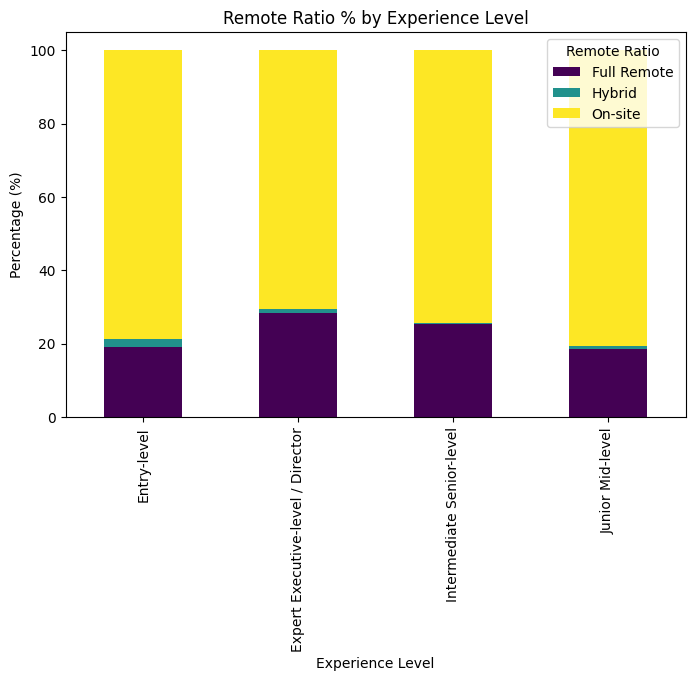

In [60]:
experience_pivot.plot(
    kind="bar", stacked=True, figsize=(8, 5), colormap="viridis"
)
plt.title("Remote Ratio % by Experience Level")
plt.ylabel("Percentage (%)")
plt.xlabel("Experience Level")
plt.legend(title="Remote Ratio")
plt.show()

Remote working seems to be pretty evenly spreaded among the different experience levels with a slight increase with more experience.

### Employment Type

In [61]:
employment_pivot = pd.crosstab(
    df["employment_type"], df["remote_ratio"], normalize="index"
) * 100

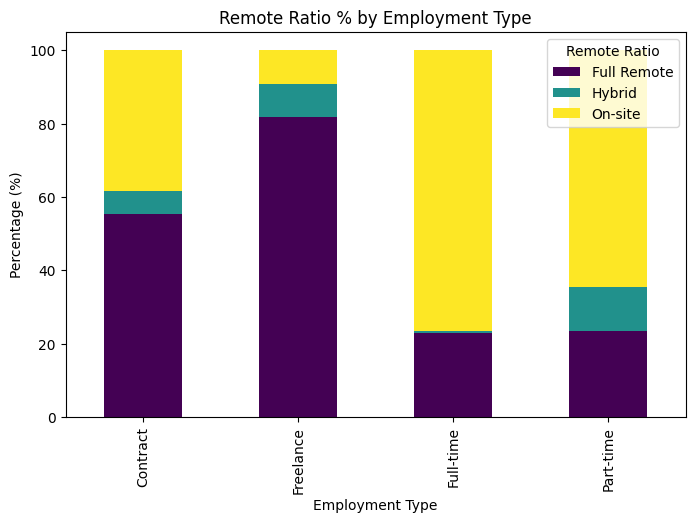

In [62]:
employment_pivot.plot(
    kind="bar", stacked=True, figsize=(8, 5), colormap="viridis"
)
plt.title("Remote Ratio % by Employment Type")
plt.ylabel("Percentage (%)")
plt.xlabel("Employment Type")
plt.legend(title="Remote Ratio")
plt.show()

As it was expected, Contracts and Freelacing are the the areas in which the full remote employment shines the most, being not much significant different between Full and Part-Time employment.

### Company Size

In [63]:
company_pivot = pd.crosstab(
    df["company_size"], df["remote_ratio"], normalize="index"
) * 100

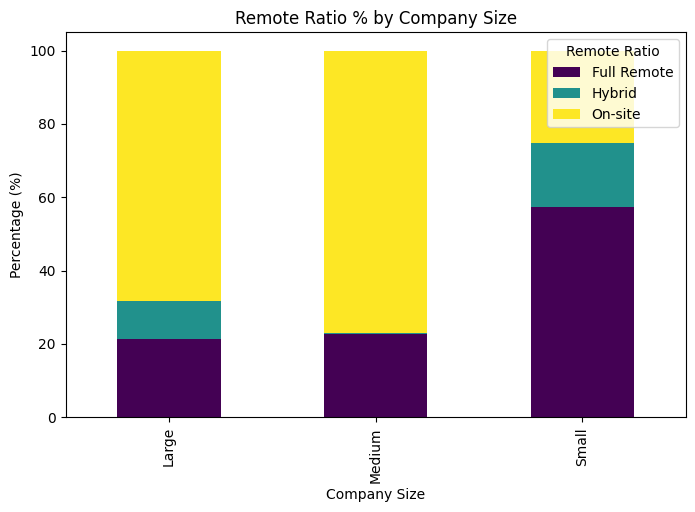

In [64]:
company_pivot.plot(
    kind="bar", stacked=True, figsize=(8, 5), colormap="viridis"
)
plt.title("Remote Ratio % by Company Size")
plt.ylabel("Percentage (%)")
plt.xlabel("Company Size")
plt.legend(title="Remote Ratio")
plt.show()

As large and medium companies tend to be on apir with full remotes at 20% of the whole worforce, small companies show toi be the ones who hired the most remoters, reaching 60% and even an adictional 15% of hybrids.

### Job Category

In [65]:
jobcat_pivot = pd.crosstab(
    df["job_category"], df["remote_ratio"], normalize="index"
) * 100

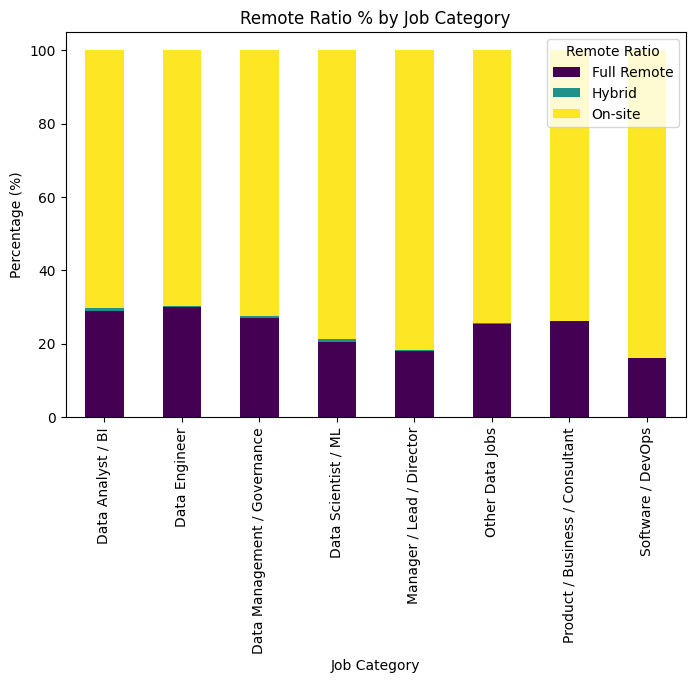

In [66]:
jobcat_pivot.plot(
    kind="bar", stacked=True, figsize=(8, 5), colormap="viridis"
)
plt.title("Remote Ratio % by Job Category")
plt.ylabel("Percentage (%)")
plt.xlabel("Job Category")
plt.legend(title="Remote Ratio")
plt.show()

Surpringly, we haven't notice any wide changes among different jobs category as we expected. Most round 20% with slightly deviations up and down.

### By year:

In [67]:
year_pivot = pd.crosstab(
    df["work_year"], df["remote_ratio"], normalize="index"
) * 100

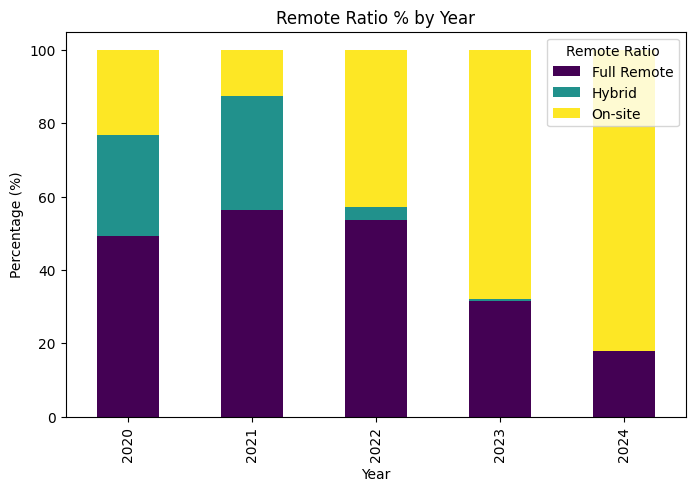

In [68]:
year_pivot.plot(
    kind="bar", stacked=True, figsize=(8, 5), colormap="viridis"
)
plt.title("Remote Ratio % by Year")
plt.ylabel("Percentage (%)")
plt.xlabel("Year")
plt.legend(title="Remote Ratio")
plt.show()

As we expected, the Covid-19 years had a huge % of remote jobs being gradually dwilling down around 20% of the workforce by 2024.

### By Company Region:

In [69]:
company_region_pivot = pd.crosstab(
    df["company_region"], df["remote_ratio"], normalize="index"
) * 100

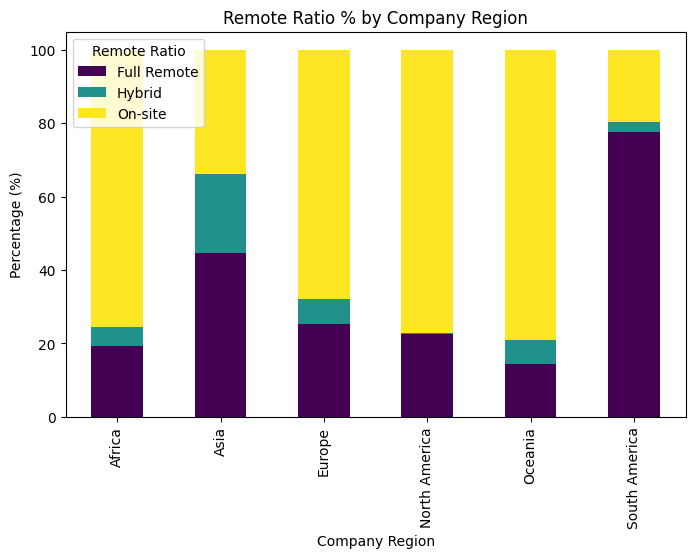

In [70]:
company_region_pivot.plot(
    kind="bar", stacked=True, figsize=(8, 5), colormap="viridis"
)
plt.title("Remote Ratio % by Company Region")
plt.ylabel("Percentage (%)")
plt.xlabel("Company Region")
plt.legend(title="Remote Ratio")
plt.show()

Companies located in South America seems to offer the most full remote jobs followed by Asia.

### By Employee Region

In [71]:
employee_region_pivot = pd.crosstab(
    df["employee_region"], df["remote_ratio"], normalize="index"
) * 100

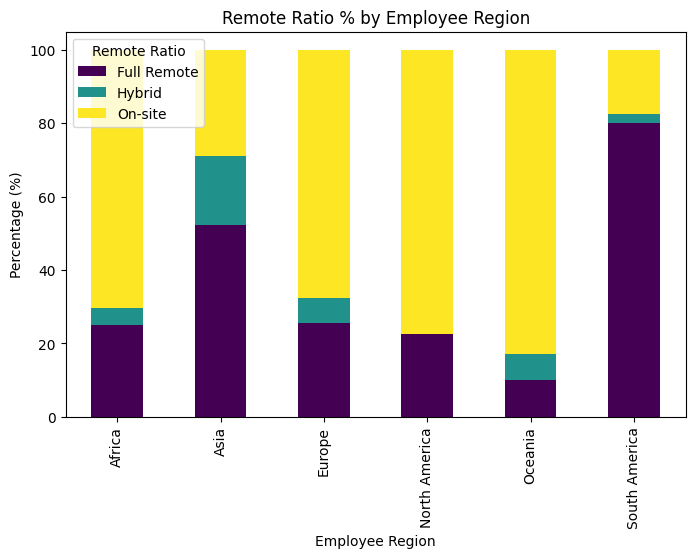

In [72]:
employee_region_pivot.plot(
    kind="bar", stacked=True, figsize=(8, 5), colormap="viridis"
)
plt.title("Remote Ratio % by Employee Region")
plt.ylabel("Percentage (%)")
plt.xlabel("Employee Region")
plt.legend(title="Remote Ratio")
plt.show()

Full remote employees tend to be abudant in South America and Asia.

## Correlations

Making a step in process of regular analysis with the main dataframe, we will create a specific dataframe to analyse corerlations.

In order to make this posible we will transform the following categorical variables back into numerical/ordinal codes attending to the specifics of its variables:

- Remote Ratio
- Experience Level
- Company Size

In [73]:
df_corr = df.copy()

In [74]:
df['remote_ratio'].unique()

array(['On-site', 'Hybrid', 'Full Remote'], dtype=object)

In [75]:
df_corr['remote_ratio_num'] = pd.Categorical(
    df_corr['remote_ratio'], 
    categories=['On-site', 'Hybrid', 'Full Remote'], 
    ordered=True
).codes

In [76]:
df_corr['remote_ratio_num'].unique()

array([0, 1, 2], dtype=int8)

In [77]:
df['experience_level'].unique()

array(['Entry-level', 'Intermediate Senior-level',
       'Expert Executive-level / Director', 'Junior Mid-level'],
      dtype=object)

In [78]:
df_corr['experience_level_num'] = pd.Categorical(
    df_corr['experience_level'], 
    categories=['Entry-level', 'Junior Mid-level', 'Intermediate Senior-level',
       'Expert Executive-level / Director'], 
    ordered=True
).codes

In [79]:
df_corr['experience_level_num'].unique()

array([0, 2, 3, 1], dtype=int8)

In [80]:
df['company_size'].unique()

array(['Small', 'Large', 'Medium'], dtype=object)

In [81]:
df_corr['company_size_num'] = pd.Categorical(
    df_corr['company_size'], 
    categories=['Small', 'Medium', 'Large'], 
    ordered=True
).codes

In [82]:
df_corr['company_size_num'].unique()

array([0, 2, 1], dtype=int8)

### By Salary

In [83]:
correlation_salary_vs_remote = df_corr['salary'].corr(df_corr['remote_ratio_num'])
print(f"Correlation between 'salary' and 'remote_ratio' is: {correlation_salary_vs_remote}")
if -0.1 <= correlation_salary_vs_remote <= 0.1 :
    print("Correlation is pratically 0, we can confidently say that remote work does not penalize salary in any sensible manner")
elif 0.1 < correlation_salary_vs_remote <= 0.4 :
    print("There is a moderate positive correlation between remote work and salary")
elif correlation_salary_vs_remote > 0.4 :
    print("There is a substantial positive correlation between remote work and salary")
elif -0.1 < correlation_salary_vs_remote <= -0.4 :
    print("There is a moderate negative correlation between remote work and salary")
elif correlation_salary_vs_remote < -0.4 :
    print("There is a substantial negative correlation between remote work and salary")

Correlation between 'salary' and 'remote_ratio' is: 0.0005429813961953153
Correlation is pratically 0, we can confidently say that remote work does not penalize salary in any sensible manner


### By Experience:

In [84]:
correlation_exp_vs_remote = df_corr['experience_level_num'].corr(df_corr['remote_ratio_num'])
print(f"Correlation between 'experience_level' and 'remote_ratio' is: {correlation_exp_vs_remote}")
if -0.1 <= correlation_salary_vs_remote <= 0.1 :
    print("Correlation is pratically 0, we can confidently say that remote work does not penalize experience in any sensible manner")
elif 0.1 < correlation_salary_vs_remote <= 0.4 :
    print("There is a moderate positive correlation between remote work and experience")
elif correlation_salary_vs_remote > 0.4 :
    print("There is a substantial positive correlation between remote work and experience")
elif -0.1 < correlation_salary_vs_remote <= -0.4 :
    print("There is a moderate negative correlation between remote work and experience")
elif correlation_salary_vs_remote < -0.4 :
    print("There is a substantial negative correlation between remote work and experience")

Correlation between 'experience_level' and 'remote_ratio' is: 0.06568302837366591
Correlation is pratically 0, we can confidently say that remote work does not penalize experience in any sensible manner


### By Company Size:

In [85]:
correlation_company_vs_remote = df_corr['company_size_num'].corr(df_corr['remote_ratio_num'])
print(f"Correlation between 'company_size' and 'remote_ratio' is: {correlation_company_vs_remote}")
if -0.1 <= correlation_salary_vs_remote <= 0.1 :
    print("Correlation is pratically 0, we can confidently say that remote work does not penalize company size in any sensible manner")
elif 0.1 < correlation_salary_vs_remote <= 0.4 :
    print("There is a moderate positive correlation between remote work and company size")
elif correlation_salary_vs_remote > 0.4 :
    print("There is a substantial positive correlation between remote work and company size")
elif -0.1 < correlation_salary_vs_remote <= -0.4 :
    print("There is a moderate negative correlation between remote work and company size")
elif correlation_salary_vs_remote < -0.4 :
    print("There is a substantial negative correlation between remote work and company size")

Correlation between 'company_size' and 'remote_ratio' is: -0.010366271378734119
Correlation is pratically 0, we can confidently say that remote work does not penalize company size in any sensible manner


**Conclusion:** 

There is **no signficant correlation** between **Remote Ratio** and:

- Salary
- Experience Level
- Company Size

## Salary Comparisons

In this section, we will study different comparisons between "worker_type" or "remote_ratio" with salaries. 

- **Remote_Ratio vs Worker_type**

And then, we will meadiated these two variable by these other third variables:

- Experience Level
- Employment Type
- Company Size
- Job Category

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



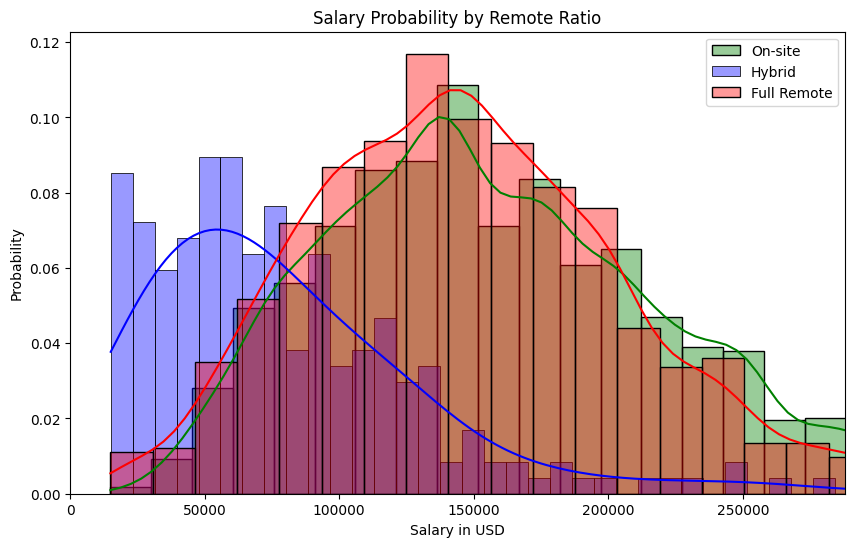

In [86]:
plt.figure(figsize=(10,6))

upper_limit = df['salary_in_usd'].quantile(0.95)

sns.histplot(df[df['remote_ratio']=="On-site"]['salary_in_usd'], 
             bins=50, kde=True, 
             color="green", label="On-site", alpha=0.4, stat="probability")

sns.histplot(df[df['remote_ratio']=="Hybrid"]['salary_in_usd'], 
             bins=50, kde=True, 
             color="blue", label="Hybrid", alpha=0.4, stat="probability")

sns.histplot(df[df['remote_ratio']=="Full Remote"]['salary_in_usd'], 
             bins=50, kde=True, 
             color="red", label="Full Remote", alpha=0.4, stat="probability")


plt.xlim(0, upper_limit)
plt.legend()
plt.xlabel("Salary in USD")
plt.ylabel("Probability")
plt.title("Salary Probability by Remote Ratio")
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



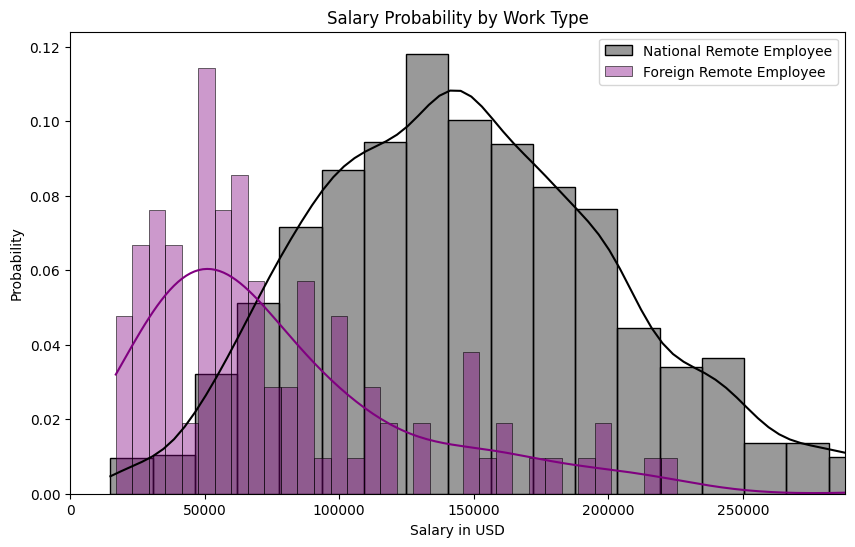

In [87]:
plt.figure(figsize=(10,6))

upper_limit = df['salary_in_usd'].quantile(0.95)

sns.histplot(df[(df['worker_type']=="National Employee") & (df['remote_ratio']=='Full Remote')]['salary_in_usd'], 
             bins=50, kde=True, 
             color="black", label="National Remote Employee", alpha=0.4, stat="probability")
sns.histplot(df[df['worker_type']=="Foreign Employee"]['salary_in_usd'], 
             bins=50, kde=True, 
             color="purple", label="Foreign Remote Employee", alpha=0.4, stat="probability")

plt.xlim(0, upper_limit)
plt.legend()
plt.xlabel("Salary in USD")
plt.ylabel("Probability")
plt.title("Salary Probability by Work Type")
plt.show()

In [88]:
salary_comparison_by_remote_ratio = df.groupby(['worker_type', 'remote_ratio'])['salary_in_usd'].mean().reset_index()

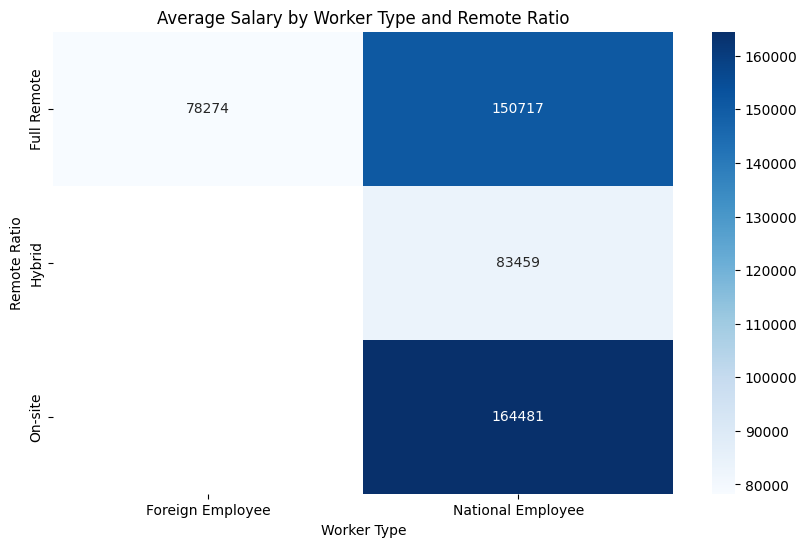

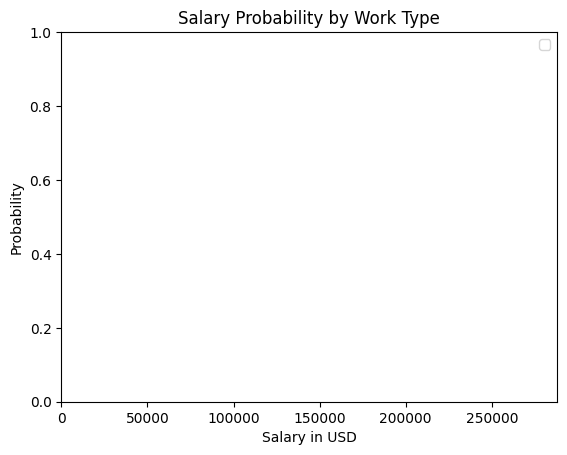

In [89]:
pivot = salary_comparison_by_remote_ratio.pivot(index='remote_ratio', columns='worker_type', values='salary_in_usd')

plt.figure(figsize=(10,6))
sns.heatmap(pivot, annot=True, fmt=".0f", cmap="Blues")
plt.title('Average Salary by Worker Type and Remote Ratio')
plt.ylabel('Remote Ratio')
plt.xlabel('Worker Type')
plt.show()

plt.xlim(0, upper_limit)
plt.legend()
plt.xlabel("Salary in USD")
plt.ylabel("Probability")
plt.title("Salary Probability by Work Type")
plt.show()

### By Experience Level:


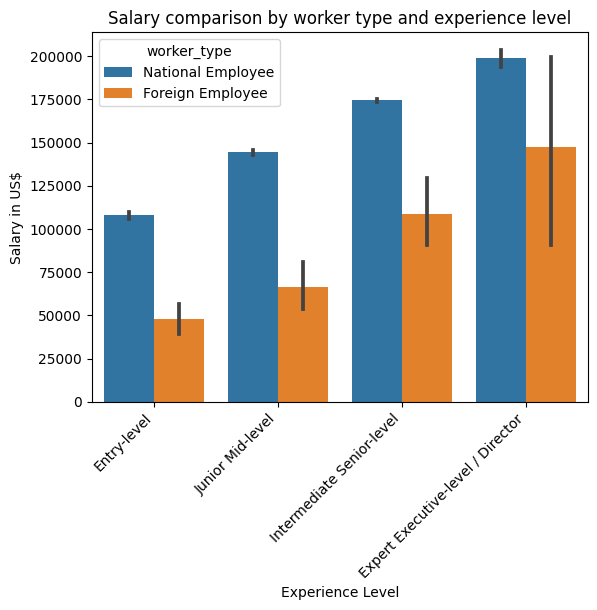

In [90]:
experience_order = ['Entry-level', 'Junior Mid-level', 'Intermediate Senior-level', 'Expert Executive-level / Director' ]

sns.barplot(data=df, x='experience_level', y='salary_in_usd', hue='worker_type',order=experience_order)
plt.title('Salary comparison by worker type and experience level')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Salary in US$')
plt.xlabel('Experience Level')
plt.show()

Here, we will resolve one of our Key Questions: **"How do salaries differ across remote, hybrid, and onsite roles?"**

In [91]:
salary_comparison_by_exp = df.groupby(['remote_ratio', 'experience_level'])['salary_in_usd'].mean().reset_index()

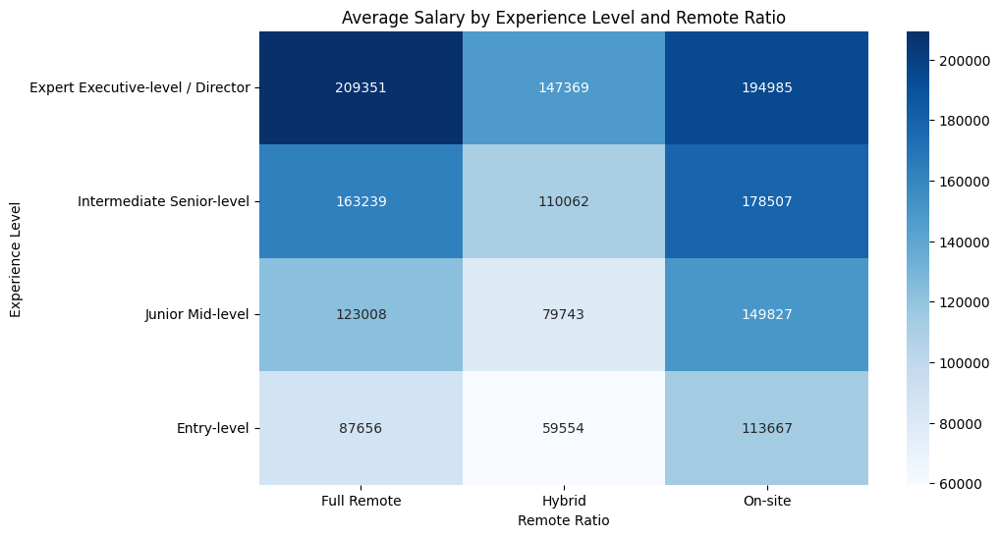

In [92]:
pivot = salary_comparison_by_exp.pivot(index='experience_level', columns='remote_ratio', values='salary_in_usd')
experience_order = [
    'Expert Executive-level / Director',
    'Intermediate Senior-level',
    'Junior Mid-level' ,
    'Entry-level' 
]

pivot = pivot.reindex(experience_order)

plt.figure(figsize=(10,6))
sns.heatmap(pivot, annot=True, fmt=".0f", cmap="Blues")
plt.title('Average Salary by Experience Level and Remote Ratio')
plt.ylabel('Experience Level')
plt.xlabel('Remote Ratio')
plt.show()


We observe that **experience is a definitive factor to explain the growth in salaries** for any type of worker_type and remote_ratio, though, foreign employees experience a wide variability in salaries as the experience level scales up.

### By Employment Type:

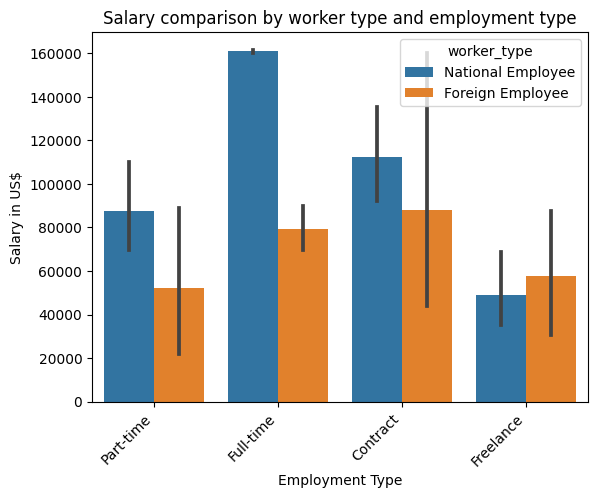

In [93]:
employment_type_order = ['Part-time', 'Full-time', 'Contract', 'Freelance' ]

sns.barplot(data=df, x='employment_type', y='salary_in_usd', hue='worker_type',order=employment_type_order)
plt.title('Salary comparison by worker type and employment type')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Salary in US$')
plt.xlabel('Employment Type')
plt.show()

In [94]:
salary_comparison_by_emp_type = df.groupby(['remote_ratio', 'employment_type'])['salary_in_usd'].mean().reset_index()

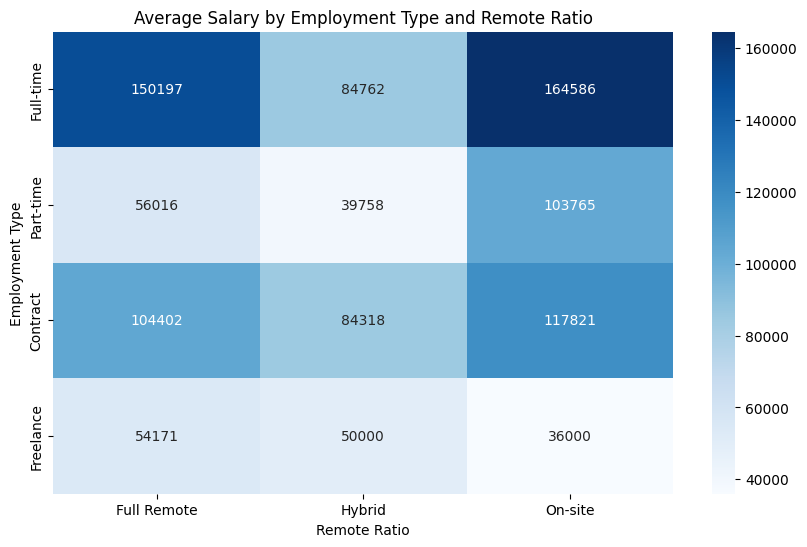

In [95]:
pivot = salary_comparison_by_emp_type.pivot(index='employment_type', columns='remote_ratio', values='salary_in_usd')
employment_type_order = [
    'Full-time',
    'Part-time',
    'Contract',
    'Freelance'
]

pivot = pivot.reindex(employment_type_order)

plt.figure(figsize=(10,6))
sns.heatmap(pivot, annot=True, fmt=".0f", cmap="Blues")
plt.title('Average Salary by Employment Type and Remote Ratio')
plt.ylabel('Employment Type')
plt.xlabel('Remote Ratio')
plt.show()

As it was expected, **Full Time is the best paid of all the employment types**, with the exception for foreign workers, which seems to enjoy similar salaries in Contracts, though the foreign employee measures have wide variances, which could be explain by the small sample of those.

### By Company Size:

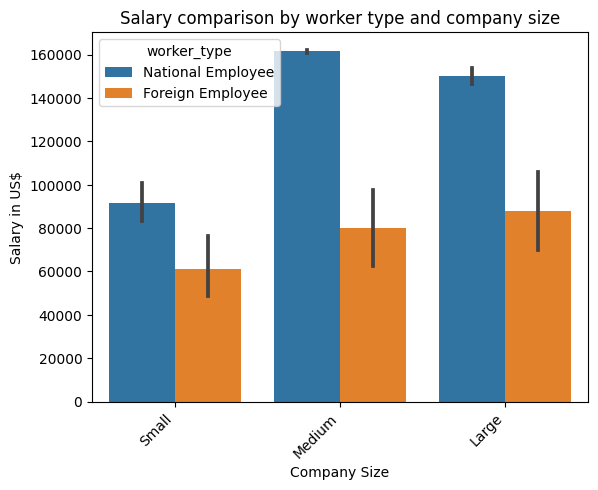

In [96]:
company_size_order = [
    'Small',
    'Medium',
    'Large'
]

sns.barplot(data=df, x='company_size', y='salary_in_usd', hue='worker_type',order=company_size_order)
plt.title('Salary comparison by worker type and company size')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Salary in US$')
plt.xlabel('Company Size')
plt.show()

In [97]:
 salary_comparison_by_comp_size= df.groupby(['remote_ratio', 'company_size'])['salary_in_usd'].mean().reset_index()

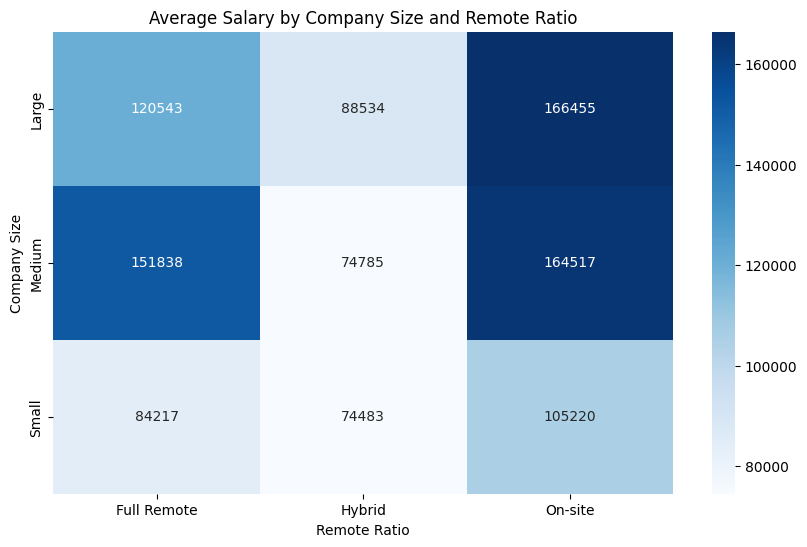

In [98]:
pivot = salary_comparison_by_comp_size.pivot(index='company_size', columns='remote_ratio', values='salary_in_usd')
company_size_order = [
    'Large',
    'Medium',
    'Small',
]

pivot = pivot.reindex(company_size_order)

plt.figure(figsize=(10,6))
sns.heatmap(pivot, annot=True, fmt=".0f", cmap="Blues")
plt.title('Average Salary by Company Size and Remote Ratio')
plt.ylabel('Company Size')
plt.xlabel('Remote Ratio')
plt.show()

Nevertheless, this analysis offers an unexpected outsome, **Medium and Large Companies seems to be paying similar Salaries on average.**

### By Job Category:

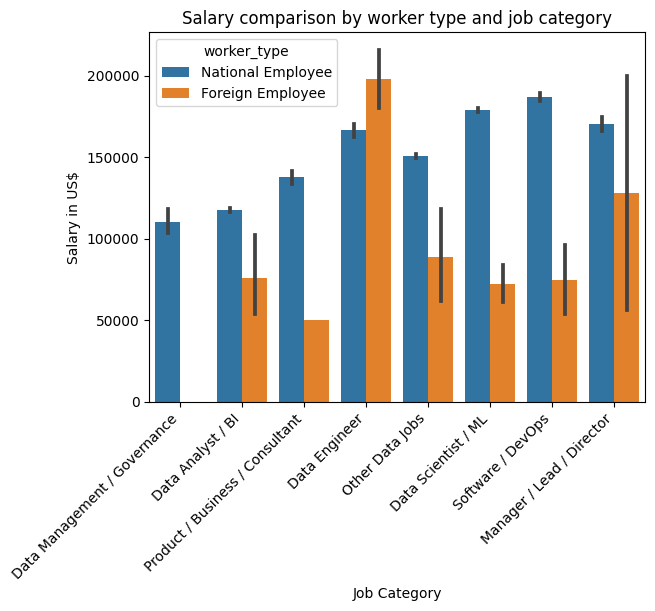

In [99]:
job_category_order = [
    "Data Management / Governance",
    "Data Analyst / BI",
    "Product / Business / Consultant",
    "Data Engineer",
    "Other Data Jobs",
    "Data Scientist / ML",
    "Software / DevOps",
    "Manager / Lead / Director"
]

sns.barplot(data=df, x='job_category', y='salary_in_usd', hue='worker_type',order=job_category_order)
plt.title('Salary comparison by worker type and job category')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Salary in US$')
plt.xlabel('Job Category')
plt.show()

In [100]:
salary_comparison_by_job_cat = df.groupby(['remote_ratio', 'job_category'])['salary_in_usd'].mean().reset_index()

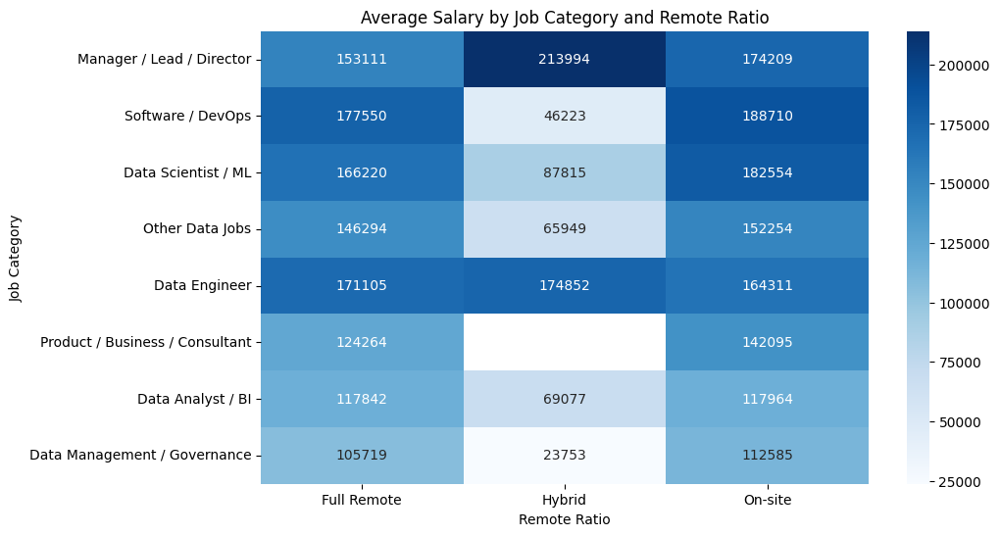

In [101]:
pivot = salary_comparison_by_job_cat.pivot(index='job_category', columns='remote_ratio', values='salary_in_usd')
job_category_order = [
    'Manager / Lead / Director',
    'Software / DevOps','Data Scientist / ML',
    'Other Data Jobs',
    'Data Engineer','Product / Business / Consultant',
    'Data Analyst / BI','Data Management / Governance']

pivot = pivot.reindex(job_category_order)

plt.figure(figsize=(10,6))
sns.heatmap(pivot, annot=True, fmt=".0f", cmap="Blues")
plt.title('Average Salary by Job Category and Remote Ratio')
plt.ylabel('Job Category')
plt.xlabel('Remote Ratio')
plt.show()

This analysis offers a more caotic picture. Overall, **the best paid jobs categories seems to be "Manager/Lead/Director" and "Data Engineers", "Data Scientist /ML" and "Software / DevOps"**

However:
- Hybrid metrics seems wildy untrustful due to the lack of a big enough sample, having some job categories compeltley unpopulated.
- Foreign Workers seem to follow the path of National Worker, but as always, the metrics experience wide variances due to the small sample.

### By Company Region:

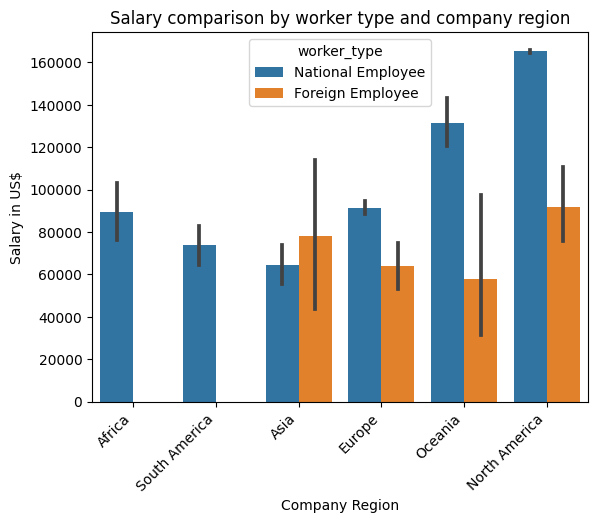

In [102]:
company_region_order = [
    'Africa',
    'South America',
    'Asia',
    'Europe',
    'Oceania',
    'North America'
]

sns.barplot(data=df, x='company_region', y='salary_in_usd', hue='worker_type',order=company_region_order)
plt.title('Salary comparison by worker type and company region')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Salary in US$')
plt.xlabel('Company Region')
plt.show()

In [103]:
salary_comparison_by_comp_reg = df.groupby(['remote_ratio', 'company_region'])['salary_in_usd'].mean().reset_index()

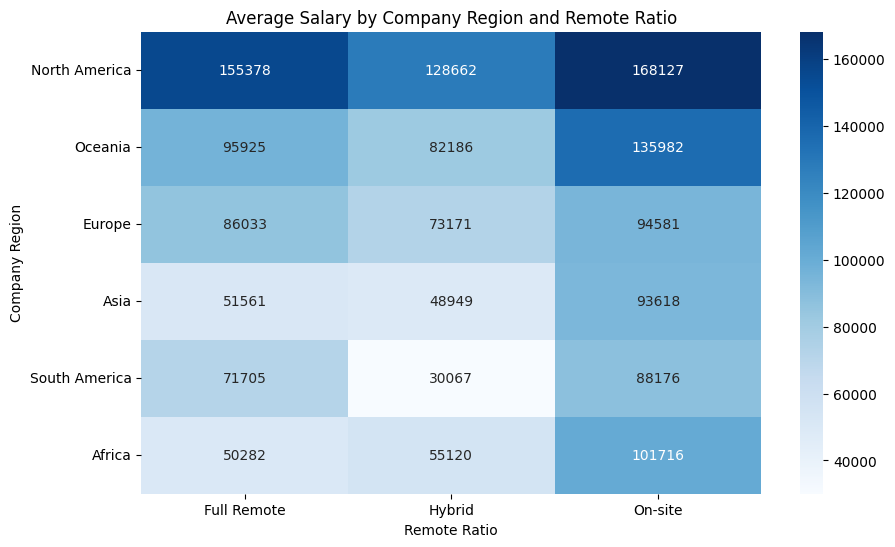

In [104]:
pivot = salary_comparison_by_comp_reg.pivot(index='company_region', columns='remote_ratio', values='salary_in_usd')

company_region_order = [
    'North America',
    'Oceania',
    'Europe',
    'Asia',
    'South America',
    'Africa']

pivot = pivot.reindex(company_region_order)

plt.figure(figsize=(10,6))
sns.heatmap(pivot, annot=True, fmt=".0f", cmap="Blues")
plt.title('Average Salary by Company Region and Remote Ratio')
plt.ylabel('Company Region')
plt.xlabel('Remote Ratio')
plt.show()

As we can see, **the best paid region by far is also the most populous for data related jobs, North America,** followed close by Oceania.

We also noticed that **in North America Remote Workers are venly paid with On-site workers, Other regions exhibit higher distances in salaries between remote ratios.**

### Overall Salary Comparison

In this section, we will study the different salary distributions among the different remate ratios and worker types.

#### Between Remote Ratios

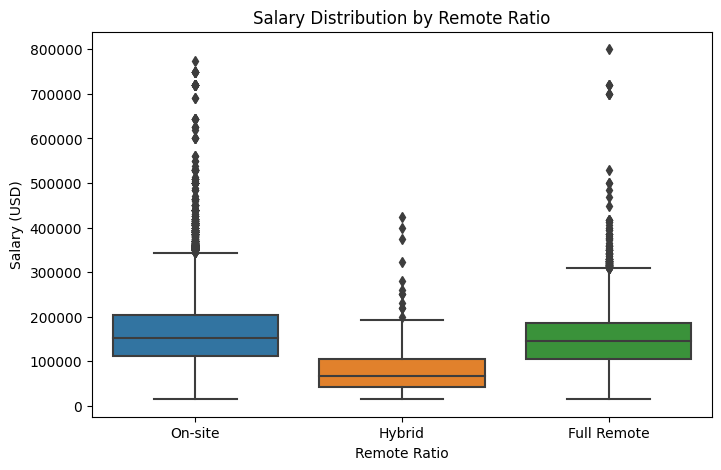

In [105]:
plt.figure(figsize=(8,5))
sns.boxplot(data=df, x="remote_ratio", y="salary_in_usd")
plt.title("Salary Distribution by Remote Ratio")
plt.xlabel("Remote Ratio")
plt.ylabel("Salary (USD)")
plt.show()

In [106]:
agg_funcs = {
    "salary_in_usd": [
        "mean", "var", "std", "min", "max",
        lambda x: x.quantile(0.25),  # Q1
        "median",                     # Q2
        lambda x: x.quantile(0.75)   # Q3
    ]
}

In [107]:
remote_stats = df.groupby("remote_ratio").agg(agg_funcs).reset_index()
remote_stats.columns = ["remote_ratio", "mean", "var", "std", "min", "max", "Q1", "median", "Q3"]
remote_stats = remote_stats.round(2)


In [108]:
print("Salary Stats by Remote Ratio:")
display(remote_stats)

Salary Stats by Remote Ratio:


,remote_ratio,mean,var,std,min,max,Q1,median,Q3
0,Full Remote,149823.09,4.039977e+09,63560.82,15000,800000,105000.0,145000.0,186600.0
1,Hybrid,83458.91,3.986658e+09,63139.99,15129,423000,42152.0,66666.0,105066.0
2,On-site,164481.41,5.560750e+09,74570.44,15000,774000,112000.0,151900.0,205000.0


#### Between Worker Types

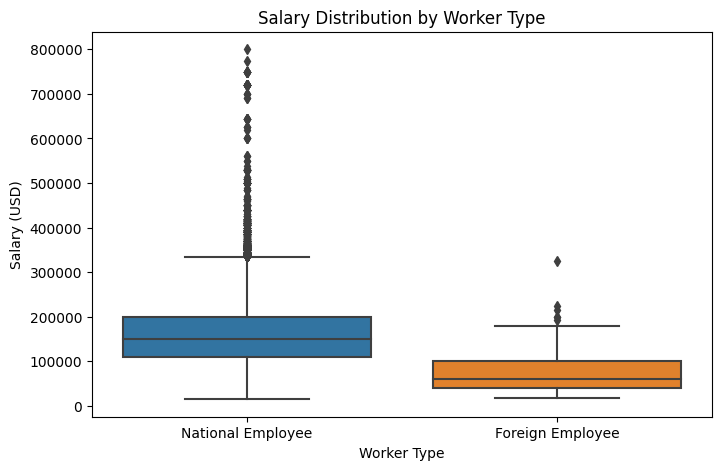

In [109]:
plt.figure(figsize=(8,5))
sns.boxplot(data=df, x="worker_type", y="salary_in_usd")
plt.title("Salary Distribution by Worker Type")
plt.xlabel("Worker Type")
plt.ylabel("Salary (USD)")
plt.show()

In [110]:
wortyp_stats = df.groupby("worker_type").agg(agg_funcs).reset_index()
wortyp_stats.columns = ["worker_type", "mean", "var", "std", "min", "max", "Q1", "median", "Q3"]
wortyp_stats = wortyp_stats.round(2)

In [111]:
print("Salary Stats by Worker Type:")
display(wortyp_stats)

Salary Stats by Worker Type:


,worker_type,mean,var,std,min,max,Q1,median,Q3
0,Foreign Employee,78273.82,2.909792e+09,53942.49,17000,323905,40000.0,60000.0,100000.0
1,National Employee,160850.15,5.265978e+09,72567.06,15000,800000,110000.0,150000.0,200000.0


**Conclusions:**

*Remote Ratio Salaries*
- On-site worker and Full Remote workers on average are paid the same, hybrid workers slightly less but that could be the result of a small sample.
- The spread measures are pretty much the same for every ratio.

*Worker Type Salaries*
- National employees not only are paid on average better but it has a wider spread, reaching higher maximums than foreigners yet reaching similar minimums.

# Machine Learning

## Preparing the Dataset

Before begining to apply any ML models to the dataset, we need to prepare the data for the specifications of the model.

### Cloning the dataset

In [112]:
df1 = df.copy()

### Transforming ordinal categorical variables into ordinal numerical ones.

In [113]:
company_size_mapping = {
    "Small": 1,
    "Medium": 2,
    "Large": 3,
}
df1["company_size"] = df1["company_size"].map(company_size_mapping).fillna(0).astype(int)

In [114]:
experience_level_mapping = {
    "Entry-level": 1,
    "Junior Mid-level": 2,
    "Intermediate Senior-level": 3,
    "Expert Executive-level / Director": 4
}
df1["experience_level"] = df1["experience_level"].map(experience_level_mapping).fillna(0).astype(int)

In [115]:
remote_ratio_mapping = {
    "On-site": 1,
    "Hybrid": 2,
    "Full Remote": 3,
}
df1["remote_ratio"] = df1["remote_ratio"].map(remote_ratio_mapping).fillna(0).astype(int)

#### Creating "Freelance?" and "Contract?" as boolean variables

In [116]:
df1["Contract?"] = np.where(df1["employment_type"] == "Contract", 1, 0)

df1["Freelance?"] = np.where(df1["employment_type"] == "Freelance", 1, 0)

#### Part and Full Time as ordinal categorical variables (inside "employment_type") and Freelance and Contract as independent variables.

In [117]:
employment_type_mapping = {
    "Contract": 0,
    "Freelance": 0,
    "Part-time": 1,
    "Full-time": 2
}
df1["employment_type"] = df1["employment_type"].map(employment_type_mapping).fillna(0).astype(int)

In [118]:
df1['Contract?'].value_counts()

Contract?
0    37157
1       47
Name: count, dtype: int64

In [119]:
df1['Freelance?'].value_counts()

Freelance?
0    37193
1       11
Name: count, dtype: int64

### Correlation Matrix

In [120]:
# List of categorical columns you want to encode
categorical_cols = ["worker_type","company_region","job_category"]

# Apply one-hot encoding only on those columns
df1_encoded = pd.get_dummies(df1, columns=categorical_cols, drop_first=True)

df1_encoded.head(5)

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,...,company_region_North America,company_region_Oceania,company_region_South America,job_category_Data Engineer,job_category_Data Management / Governance,job_category_Data Scientist / ML,job_category_Manager / Lead / Director,job_category_Other Data Jobs,job_category_Product / Business / Consultant,job_category_Software / DevOps
0,2020,1,2,Azure Data Engineer,100000,USD,100000,MUS,1,MUS,...,False,False,False,False,False,False,False,True,False,False
1,2020,1,0,Staff Data Analyst,60000,CAD,44753,CAN,2,CAN,...,True,False,False,False,False,False,False,False,False,False
2,2020,3,2,Staff Data Scientist,164000,USD,164000,USA,2,USA,...,True,False,False,False,False,True,False,False,False,False
3,2020,1,2,Data Analyst,42000,EUR,47899,DEU,1,DEU,...,False,False,False,False,False,False,False,False,False,False
4,2020,4,2,Data Scientist,300000,USD,300000,USA,3,USA,...,True,False,False,False,False,True,False,False,False,False


In [121]:
df1_encoded = df1_encoded.drop(["job_title","salary_currency","salary","employee_residence","company_location","Contract?","Freelance?","employee_region"], axis=1)
df1_encoded.head(5)

,work_year,experience_level,employment_type,salary_in_usd,remote_ratio,company_size,worker_type_National Employee,company_region_Asia,company_region_Europe,company_region_North America,company_region_Oceania,company_region_South America,job_category_Data Engineer,job_category_Data Management / Governance,job_category_Data Scientist / ML,job_category_Manager / Lead / Director,job_category_Other Data Jobs,job_category_Product / Business / Consultant,job_category_Software / DevOps
0,2020,1,2,100000,1,1,True,False,False,False,False,False,False,False,False,False,True,False,False
1,2020,1,0,44753,2,3,True,False,False,True,False,False,False,False,False,False,False,False,False
2,2020,3,2,164000,2,2,True,False,False,True,False,False,False,False,True,False,False,False,False
3,2020,1,2,47899,1,3,True,False,True,False,False,False,False,False,False,False,False,False,False
4,2020,4,2,300000,3,3,True,False,False,True,False,False,False,False,True,False,False,False,False


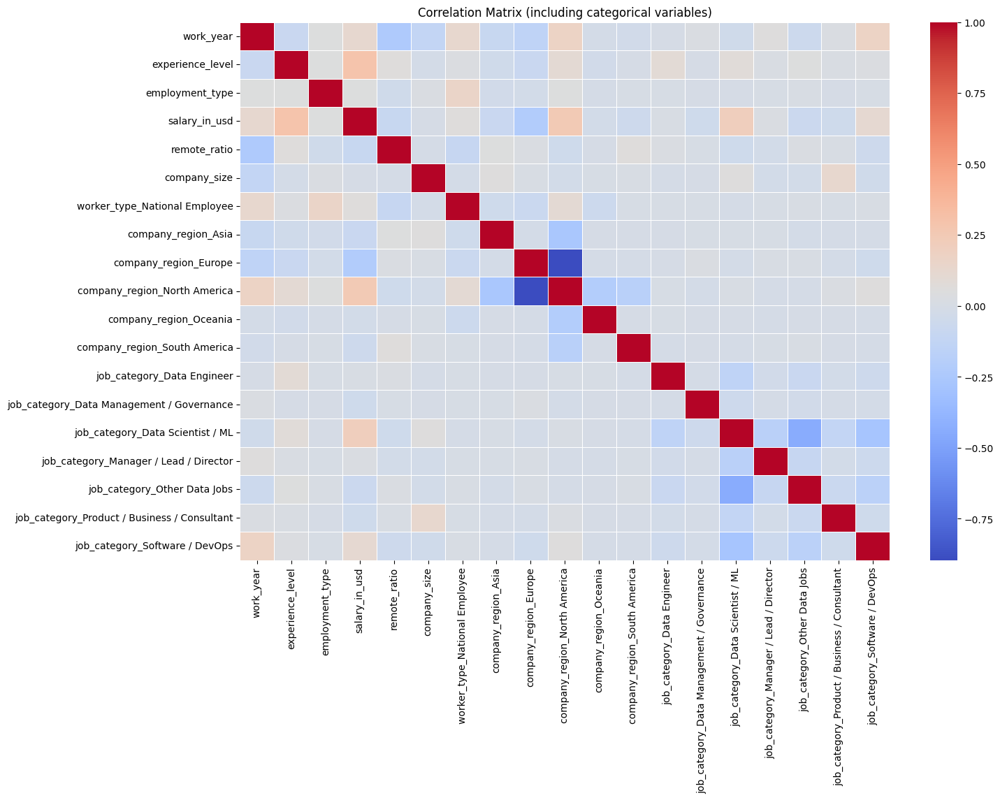

In [122]:
# Compute correlation matrix
corr_matrix = df1_encoded.corr()

# Plot heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Matrix (including categorical variables)")
plt.show()

In [123]:
df1["employment_type"].value_counts()

employment_type
2    37095
0       58
1       51
Name: count, dtype: int64

In [124]:
# One-hot encode job_category
job_dummies = pd.get_dummies(df1['job_category'], prefix='job').astype(int)

# Add them back to df
df1 = pd.concat([df1, job_dummies], axis=1)


In [125]:
# One-hot encode company_region
company_dummies = pd.get_dummies(df1['company_region'], prefix='comp').astype(int)

# Add them back to df
df1 = pd.concat([df1, company_dummies], axis=1)

In [126]:
df1.head(5)

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,...,job_Manager / Lead / Director,job_Other Data Jobs,job_Product / Business / Consultant,job_Software / DevOps,comp_Africa,comp_Asia,comp_Europe,comp_North America,comp_Oceania,comp_South America
0,2020,1,2,Azure Data Engineer,100000,USD,100000,MUS,1,MUS,...,0,1,0,0,1,0,0,0,0,0
1,2020,1,0,Staff Data Analyst,60000,CAD,44753,CAN,2,CAN,...,0,0,0,0,0,0,0,1,0,0
2,2020,3,2,Staff Data Scientist,164000,USD,164000,USA,2,USA,...,0,0,0,0,0,0,0,1,0,0
3,2020,1,2,Data Analyst,42000,EUR,47899,DEU,1,DEU,...,0,0,0,0,0,0,1,0,0,0
4,2020,4,2,Data Scientist,300000,USD,300000,USA,3,USA,...,0,0,0,0,0,0,0,1,0,0


In [127]:
df1 = df1.drop(['job_title','salary_currency','employee_residence','company_location','salary','work_year','job_category','employee_region','company_region'], axis = 1)
df1.head(5)

,experience_level,employment_type,salary_in_usd,remote_ratio,company_size,worker_type,Contract?,Freelance?,job_Data Analyst / BI,job_Data Engineer,...,job_Manager / Lead / Director,job_Other Data Jobs,job_Product / Business / Consultant,job_Software / DevOps,comp_Africa,comp_Asia,comp_Europe,comp_North America,comp_Oceania,comp_South America
0,1,2,100000,1,1,National Employee,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
1,1,0,44753,2,3,National Employee,1,0,1,0,...,0,0,0,0,0,0,0,1,0,0
2,3,2,164000,2,2,National Employee,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,1,2,47899,1,3,National Employee,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
4,4,2,300000,3,3,National Employee,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [128]:
df1.dtypes

experience_level                        int64
employment_type                         int64
salary_in_usd                           int64
remote_ratio                            int64
company_size                            int64
worker_type                            object
Contract?                               int64
Freelance?                              int64
job_Data Analyst / BI                   int64
job_Data Engineer                       int64
job_Data Management / Governance        int64
job_Data Scientist / ML                 int64
job_Manager / Lead / Director           int64
job_Other Data Jobs                     int64
job_Product / Business / Consultant     int64
job_Software / DevOps                   int64
comp_Africa                             int64
comp_Asia                               int64
comp_Europe                             int64
comp_North America                      int64
comp_Oceania                            int64
comp_South America                

We dropped the following variables:

- **'job_title'**: With job_categories, there is no use for that bloated variable.
- **'salary_currency' and 'salary'**: With salary in USD there is no need for confusing the models with different currencies.
- **'employee_residence' and 'employee_region'**: We believe company location is more relevant than the employee residence.
- **'company_location'**: With company_region, there is no use for that bloated variable.
- **'company_region'**: Once this categorical variable has been splited into dummies, we no longer need it.
- **'job_category'**: Once this categorical variable has been splited into dummies, we no longer need it.
- **'work_year'**: As we have previously seen in our analysis, COVID-19 had a huge impact on remote jobs. Adding this variable will obscure other valuable insights in our models.

## 1st Random Forest Model, target: "worker_type".

### Creating a sample in which National and Foreign Employees are on equal terms

In [129]:
df2_majority = df1[df1["worker_type"] == "National Employee"]
df2_minority = df1[df1["worker_type"] == "Foreign Employee"]

In [130]:
df2_majority_down = resample(df2_majority,
                            replace=False,   # no replacement
                            n_samples=len(df2_minority), # match minority size
                            random_state=42)

In [131]:
df2 = pd.concat([df2_majority_down, df2_minority]).reset_index()
df2 = df2.drop(['index'], axis=1)
print(df2["worker_type"].value_counts())

worker_type
National Employee    105
Foreign Employee     105
Name: count, dtype: int64


In [132]:
df2.head(5)

,experience_level,employment_type,salary_in_usd,remote_ratio,company_size,worker_type,Contract?,Freelance?,job_Data Analyst / BI,job_Data Engineer,...,job_Manager / Lead / Director,job_Other Data Jobs,job_Product / Business / Consultant,job_Software / DevOps,comp_Africa,comp_Asia,comp_Europe,comp_North America,comp_Oceania,comp_South America
0,3,2,229900,1,2,National Employee,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
1,4,2,209700,1,2,National Employee,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,4,2,334075,1,2,National Employee,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
3,2,2,250000,1,2,National Employee,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,2,2,49183,1,2,National Employee,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


### Applying RF (1st Model)

In [133]:
X = df2.drop(['worker_type','remote_ratio'], axis = 1)
y = df2['worker_type']

In [134]:
model = RandomForestClassifier(n_estimators=100, random_state=42,n_jobs=-1)

In [135]:
scoring = {
    "accuracy": "accuracy",
    "precision": make_scorer(precision_score, average="weighted"),
    "recall": make_scorer(recall_score, average="weighted"),
    "f1": make_scorer(f1_score, average="weighted")
}

cv_results = cross_validate(model, X, df2['worker_type'], cv=5, scoring=scoring)

In [136]:
for metric in scoring:
    print(f"{metric.capitalize()} per fold: {cv_results['test_' + metric]}")
    print(f"Mean {metric.capitalize()}: {cv_results['test_' + metric].mean()}\n")

Accuracy per fold: [0.83333333 0.9047619  0.85714286 0.88095238 0.88095238]
Mean Accuracy: 0.8714285714285716

Precision per fold: [0.83409091 0.90846682 0.8604119  0.88888889 0.88181818]
Mean Precision: 0.8747353396666899

Recall per fold: [0.83333333 0.9047619  0.85714286 0.88095238 0.88095238]
Mean Recall: 0.8714285714285716

F1 per fold: [0.8332388  0.90454545 0.85681818 0.88034188 0.88088486]
Mean F1: 0.8711658339139905



### Confusion Matrix (1st Model)

In [137]:
y_pred_cv = cross_val_predict(model, X, y, cv=5)
labels = np.unique(y)


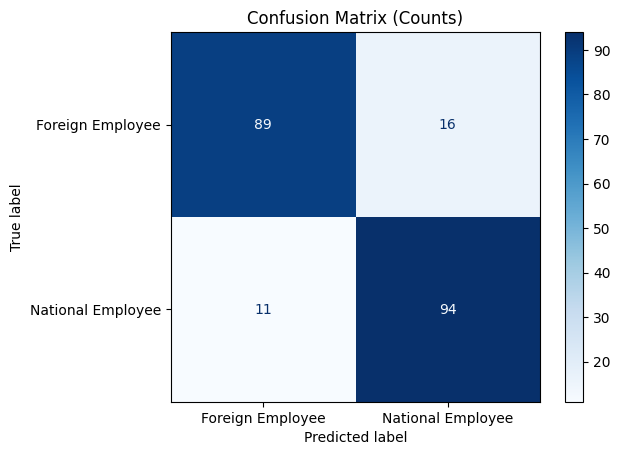

In [138]:
cm = confusion_matrix(y, y_pred_cv, labels=labels)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot(cmap="Blues", values_format="d")
plt.title("Confusion Matrix (Counts)")
plt.show()

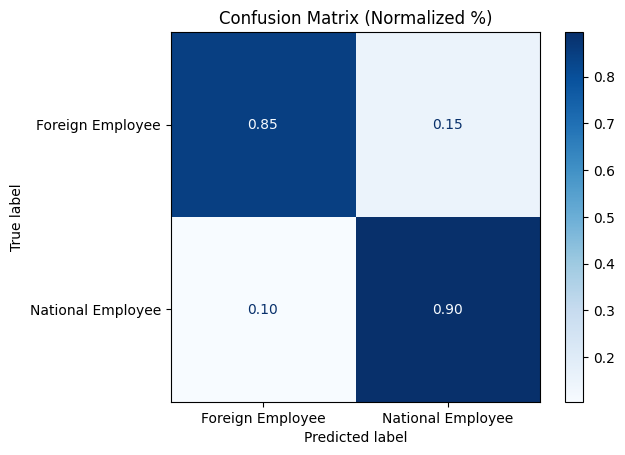

In [139]:
cm_normalized = confusion_matrix(y, y_pred_cv, labels=labels, normalize="true")
disp_norm = ConfusionMatrixDisplay(confusion_matrix=cm_normalized, display_labels=labels)
disp_norm.plot(cmap="Blues", values_format=".2f")
plt.title("Confusion Matrix (Normalized %)")
plt.show()

### Applying SHAP for explainability (1st Model)

In [140]:
model.fit(X, y)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [141]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

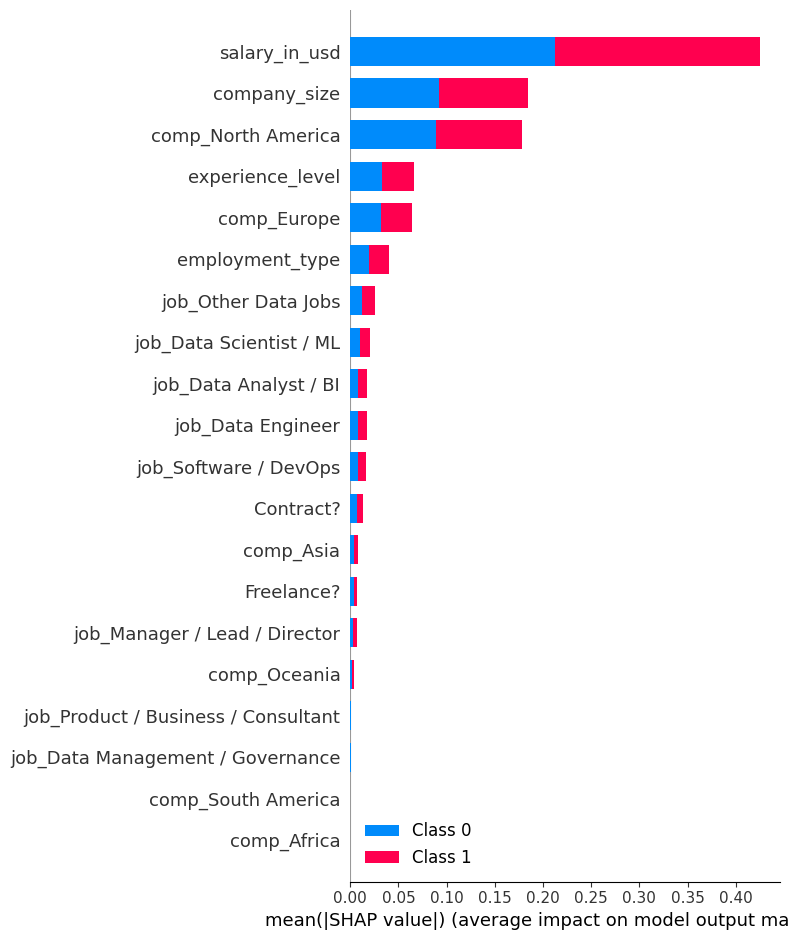

In [142]:
shap.summary_plot(shap_values, X)

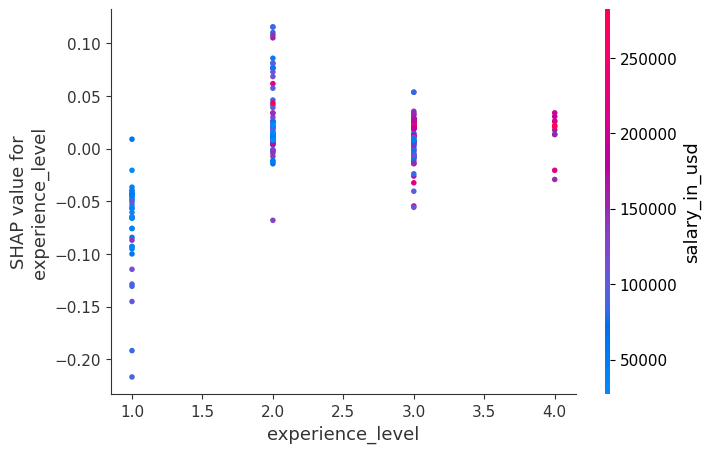

In [143]:
shap.dependence_plot("experience_level", shap_values[1], X, interaction_index="salary_in_usd")

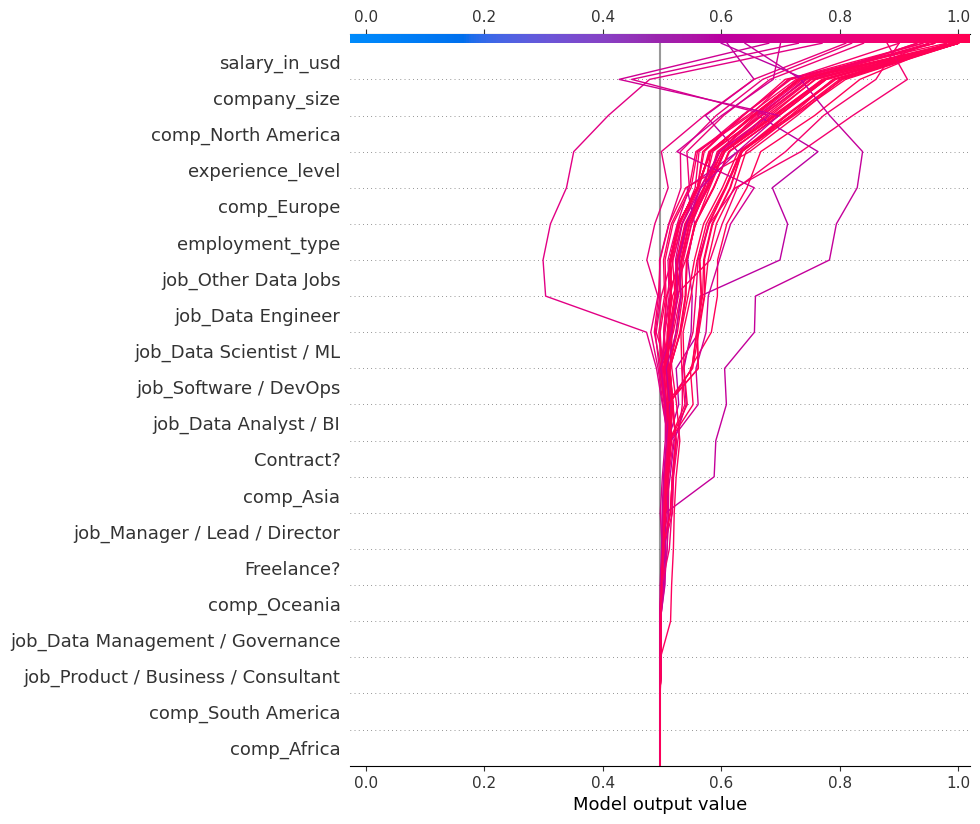

In [144]:
shap.decision_plot(explainer.expected_value[1], shap_values[1][:50], X.iloc[:50])


#### Feature Importance Analysis
Using SHAP values, we identified the features that most influence the prediction:

1. Salary
2. Company size
3. North America as a company region
4. Experience level

Interpretation:
- Salaries vastly explain the differences between remote roles.
- Small companies are more likely to offer remote positions.
- North America seems to offer more remote options.
- Experience level explains a little of the variance but seems midly relevant.

## 2nd Random Forest Model, target: "remote_ratio"

### Creating a more balanced sample for "remote_ratio"

In [145]:
df1['remote_ratio'].value_counts()

remote_ratio
1    28460
3     8509
2      235
Name: count, dtype: int64

Hybrid jobs are only 235, and it doesn't has sufficient weight to be meaningful in this analysis. For simplicity, **we will remove Hybrids from the Dataset in order to get a simpler and more reliable base to further our analysis.**

In [146]:
df1 = df1[df1["remote_ratio"] != 2]
df1['remote_ratio'].value_counts()

remote_ratio
1    28460
3     8509
Name: count, dtype: int64

In [147]:
remote_ratio_mapping = {
    1: 1,
    3: 2,
}
df1["remote_ratio"] = df1["remote_ratio"].map(remote_ratio_mapping).fillna(0).astype(int)

In [148]:
df1['remote_ratio'].value_counts()

remote_ratio
1    28460
2     8509
Name: count, dtype: int64

In [149]:
df3 = df1.copy()

In [150]:
df3_majority = df1[df1["remote_ratio"] == 1]
df3_minority = df1[df1["remote_ratio"] == 2]

In [151]:
df3_majority_down = resample(df3_majority,
                            replace=False,   # no replacement
                            n_samples=len(df3_minority), # match minority size
                            random_state=42)

In [152]:
df3 = pd.concat([df3_majority_down, df3_minority]).reset_index()
df3 = df3.drop(['index'], axis=1)
print(df3["remote_ratio"].value_counts())

remote_ratio
1    8509
2    8509
Name: count, dtype: int64


In [153]:
df3.head(5)

,experience_level,employment_type,salary_in_usd,remote_ratio,company_size,worker_type,Contract?,Freelance?,job_Data Analyst / BI,job_Data Engineer,...,job_Manager / Lead / Director,job_Other Data Jobs,job_Product / Business / Consultant,job_Software / DevOps,comp_Africa,comp_Asia,comp_Europe,comp_North America,comp_Oceania,comp_South America
0,3,2,440000,1,2,National Employee,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,3,2,140000,1,2,National Employee,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
2,3,2,140000,1,2,National Employee,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
3,3,2,277000,1,2,National Employee,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
4,3,2,720000,1,2,National Employee,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0


In [154]:
df3.columns

Index(['experience_level', 'employment_type', 'salary_in_usd', 'remote_ratio',
       'company_size', 'worker_type', 'Contract?', 'Freelance?',
       'job_Data Analyst / BI', 'job_Data Engineer',
       'job_Data Management / Governance', 'job_Data Scientist / ML',
       'job_Manager / Lead / Director', 'job_Other Data Jobs',
       'job_Product / Business / Consultant', 'job_Software / DevOps',
       'comp_Africa', 'comp_Asia', 'comp_Europe', 'comp_North America',
       'comp_Oceania', 'comp_South America'],
      dtype='object')

### Applying RF (2nd Model)

In [155]:
X = df3.drop(['remote_ratio','worker_type'], axis = 1)
y = df3['remote_ratio']

In [156]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)


In [157]:
rf = RandomForestClassifier(
    n_estimators=200,
    random_state=42,
    n_jobs=-1,
    class_weight="balanced"
)

In [158]:
thresholds = np.arange(0.3, 0.71, 0.05)   # test thresholds 0.30 → 0.70
results = []

In [159]:
for train_idx, test_idx in skf.split(X, y):
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    rf.fit(X_train, y_train)
    
    # probability of being class 2 (remote)
    y_probs = rf.predict_proba(X_test)[:, 1]

    for thr in thresholds:
        y_pred_thr = (y_probs >= thr).astype(int) + 1  # shift to {1,2} instead of {0,1}

        precision, recall, f1, _ = precision_recall_fscore_support(
            y_test, y_pred_thr, average="binary", pos_label=2
        )

        results.append({
            "threshold": thr,
            "precision": precision,
            "recall": recall,
            "f1": f1
        })

In [160]:
df_results = pd.DataFrame(results)
summary = df_results.groupby("threshold").mean().reset_index()
print(summary)

   threshold  precision    recall        f1
0       0.30   0.613141  0.838995  0.708494
1       0.35   0.625758  0.804679  0.703998
2       0.40   0.637461  0.773418  0.698843
3       0.45   0.645409  0.744978  0.691585
4       0.50   0.653985  0.715245  0.683170
5       0.55   0.663019  0.681399  0.671925
6       0.60   0.674420  0.627926  0.650131
7       0.65   0.687420  0.558940  0.616404
8       0.70   0.694522  0.458223  0.552044


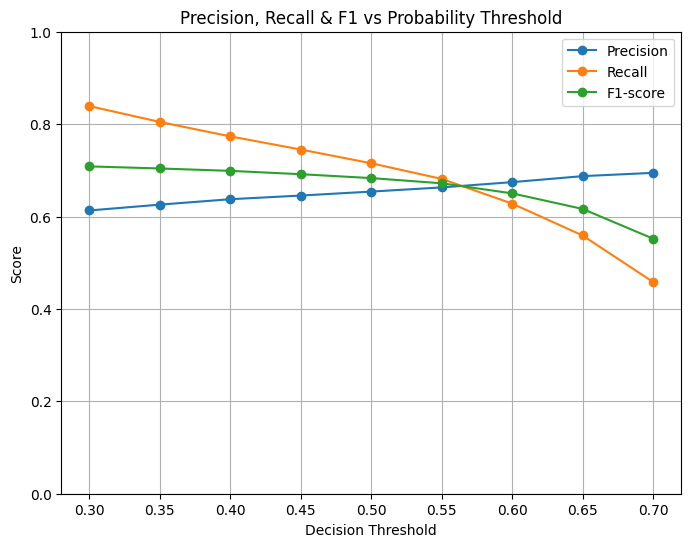

In [161]:
plt.figure(figsize=(8,6))
plt.plot(summary["threshold"], summary["precision"], marker="o", label="Precision")
plt.plot(summary["threshold"], summary["recall"], marker="o", label="Recall")
plt.plot(summary["threshold"], summary["f1"], marker="o", label="F1-score")

plt.title("Precision, Recall & F1 vs Probability Threshold")
plt.xlabel("Decision Threshold")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.legend()
plt.grid(True)
plt.show()

### Confusion Matrix (2nd Model)

In [162]:
best_thr = 0.45


In [163]:
rf.fit(X, y)
y_probs = rf.predict_proba(X)[:, 1]
y_pred_thr = (y_probs >= best_thr).astype(int) + 1

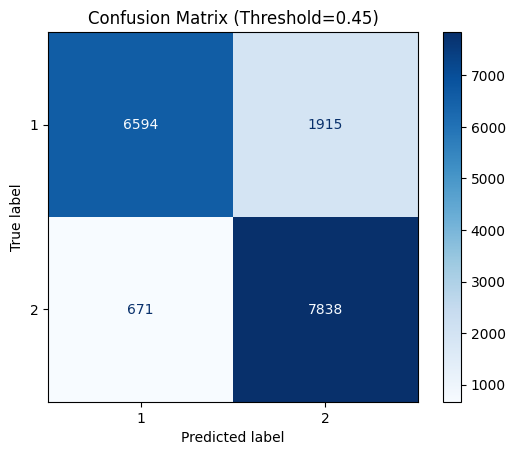

In [164]:
cm = confusion_matrix(y, y_pred_thr, labels=[1,2])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[1,2])
disp.plot(cmap="Blues", values_format="d")
plt.title(f"Confusion Matrix (Threshold={best_thr})")
plt.show()

### Applying SHAP for explainability (2nd Model)

In [165]:
model.fit(X, y)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [166]:
background = shap.sample(X, 100, random_state=42)
explainer = shap.TreeExplainer(model, data=background)

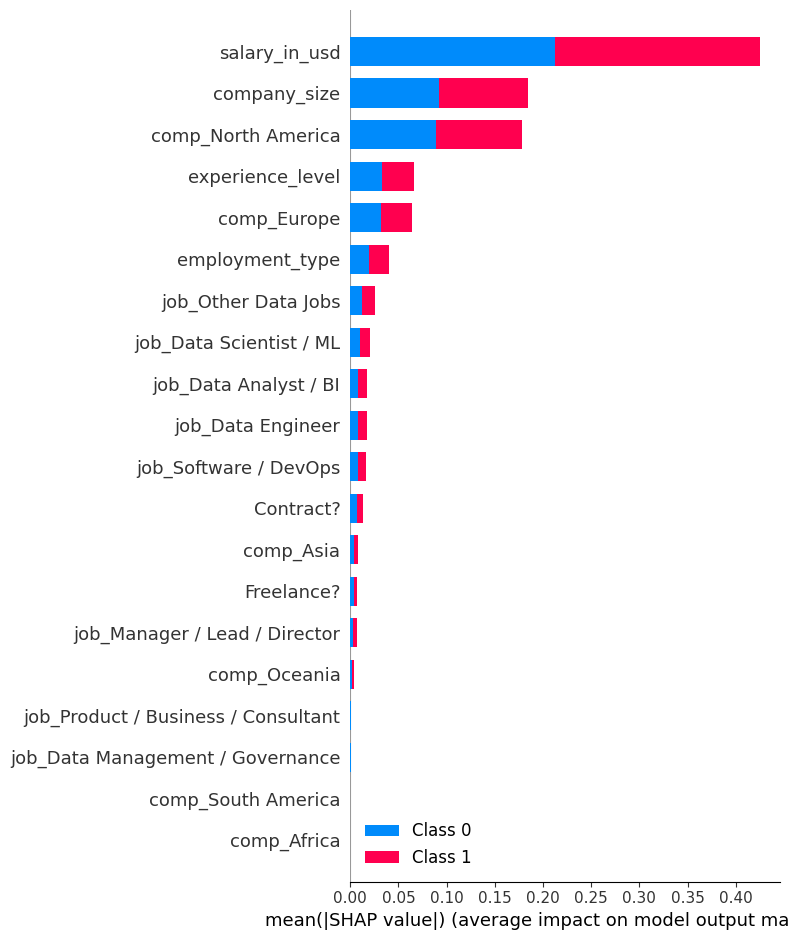

In [167]:
shap.summary_plot(shap_values, X)

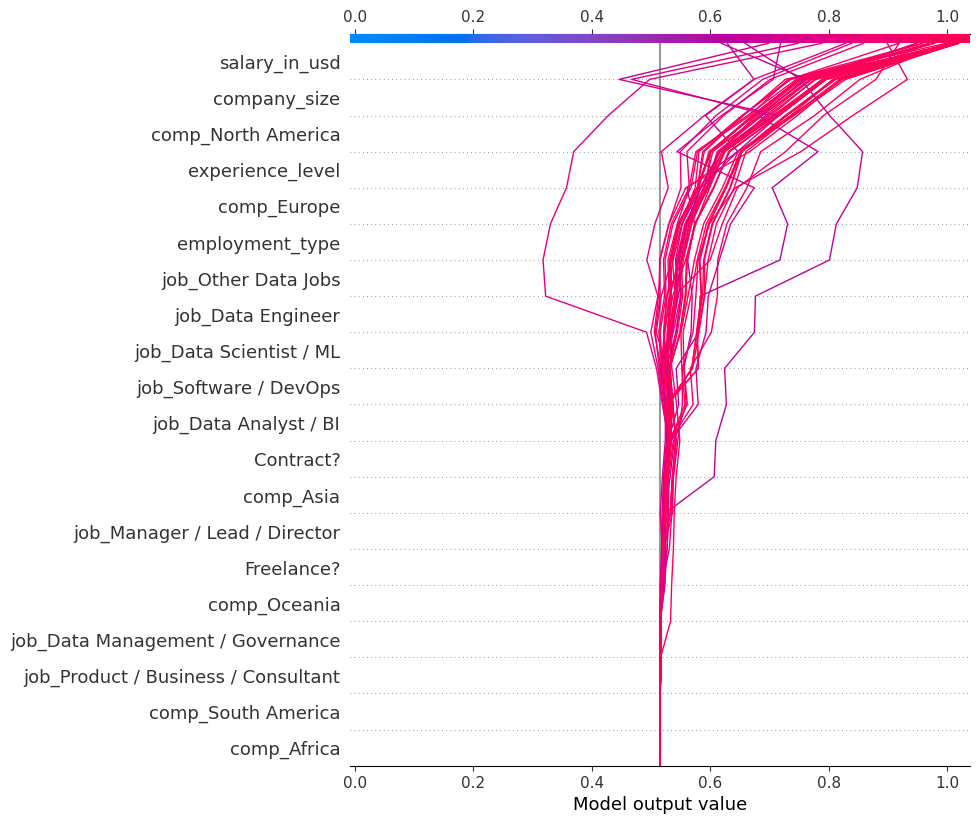

In [168]:
shap.decision_plot(explainer.expected_value[1], shap_values[1][:50], X.iloc[:50])

#### Feature Importance Analysis
Using SHAP values, we identified the features that most influence the prediction:

1. Salary
2. Company size
3. North America as a company region
4. Experience level

Interpretation:
- Salaries vastly explain the differences between remote roles.
- Small companies are more likely to offer remote positions.
- North America seems to offer more remote options.
- Experience level explains a little of the variance but seems midly relevant.

# Final Conclusions

## Overall Limitations

- The analysis of "foreign employees" vs "national employees" was heavily crippled due to a not very large sample of foreign employees (105).
- Hybrid Remote work was also a very tiny fraction of the dataset and couldn't be explored in full detail.
- Other categories like "Contract" and "Freelance" were also lacking of good sampling.

## Responding to our KEY QUESTIONS

### Is there any difference between national remote workers and remote foreign workers?

Yes, there are substancial differences:

- The vast mayority of Full Remote workers are National Employees.
- Foreign Workers are paid on average half of what National Full Remote Workers are paid for, though they have a larger variance.
- There relative scarcity of foreign workers in the dataset, as we have mentioned in "Overall Limitations" haven't allowed us to persuit more in depth analysis.


### How do salaries differ across remote, hybrid, and onsite roles

Remote and On-Site are on average pretty much evenly matched, especially in the North American region, with is the vasy mayority of this Dataset.

The Hybrid role seems to be paid substantially less but that could be dfue to the lack of a good sampling.

### Which jobs are more likely to be remote?

There is not much differences across the different jobs thought we have found that Data Enginieer, Data Anlysts and Business are the ones with a slight higher remote representation.

### Which countries and company sizes provide the most remote opportunities?

- Asia and South America tend to hired a high % of their workfore in full remote roles, though, in absolute numbers, North America provide the vast amount of Full Remote jobs.
- Small companies seems to provide the msot remote opportunities among all sizes.

### Are remote roles associated with higher experience levels or certain types of employments?

- The highest level of experience 'Expert Executive-level / Director' is slightly more remotable than the others.
- Yes, Remote Jobs seems to be in abundance on Contracts and Freelancing.

##### Export to Github

In [ ]:
from kaggle_secrets import UserSecretsClient
import os
import shutil

secrets = UserSecretsClient()
token = secrets.get_secret("GITHUB_TOKEN") 
# Step 2: Git configuration
!git config --global user.name "alopezmoreira1989"
!git config --global user.email "alopezmoreira1989@users.noreply.github.com"

repo_name = "Remote-Work-in-Data-Science"
username = "alopezmoreira1989"

!git clone https://{token}@github.com/{username}/{repo_name}.git

os.chdir(f"/kaggle/working/{repo_name}")

for filename in os.listdir("/kaggle/working"):
    if filename != repo_name:
        shutil.move(f"/kaggle/working/{filename}", f"/kaggle/working/{repo_name}")

!git add .
!git commit -m "Upload Kaggle notebook and files"
!git push origin main